### BADASS Analysis: sugars

Can we distinguish five different sugar molecules from one another? And can we reduce the number of peptides we include in the array without negatively affecting model performance?

#### Analytes

Sugars:
- D-(+)-mannose (man)
- D-(-)-fructose (fru)
- D-(+)-glucose (glu)
- D-(+)-maltose monohydrate (mal)
- D-(+)-glucosamine HCl (gluam)

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, cohen_kappa_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Large array sugar data

In [3]:
sugar_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/'
                           'Sugars/Reformatted_sugar_csvs/'},
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/'
                'Sugars/Sugar_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep', 'CCPent', 'QLKEIA', 'CCHex2-I24K', 'CCHept-I24N', 'CCHept-L28W',
                            'GRP22', 'CCHex', 'NLKEIA', 'CCHept-L28K', 'CCHept-I24T', 'CCHept-L7Y',
                            'GRP35', 'CCHex2', 'CCHept-I17G-L21G', 'CCHept-I17H', 'CCHept-I24H', 'CCHept-L28Y',
                            'GRP46', 'CCHept', 'CCHept-I17A-L21A', 'CCHept-I17K-L24E', 'CCHept-L21S-I24S',
                            'CCHept-I24Y', 'GRP51', 'CCHept-I24D', 'CCHept-L14A', 'CCHept-L7K',
                            'CCHept-L21N-I24N', 'CCHept-L21S-I24Y', 'GRP52', 'CCHept-I24E', 'CCHept-L21A',
                            'CCHept-L21K-I24E', 'CCHept-L21T-I24T', 'CCHept-L21Y-I24S', 'GRP63', 'CCHept-I24K',
                            'CCHept-L21K', 'CCHept-L21E-I24K', 'CCHept-L21H-I24H', 'CCHept-I17T', 'GRP80',
                            'CCHept-I17K', 'CCPent-I24K', 'CCHept-I24S', 'CCHept-L7W', 'CCHept-I24P']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
sugar_fluor_data.group_xlsx_repeats()

In [5]:
sugar_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['fru_repeat_1.xlsx',
                             'glu_repeat_1.xlsx',
                             'gluam_repeat_1.xlsx',
                             'mal_repeat_1.xlsx',
                             'man_repeat_1.xlsx'])])),
             ('repeat_2',
              OrderedDict([('DPH',
                            ['fru_repeat_2.xlsx',
                             'glu_repeat_2.xlsx',
                             'gluam_repeat_2.xlsx',
                             'mal_repeat_2.xlsx',
                             'man_repeat_2.xlsx'])])),
             ('repeat_3',
              OrderedDict([('DPH',
                            ['fru_repeat_3.xlsx',
                             'glu_repeat_3.xlsx',
                             'gluam_repeat_3.xlsx',
                             'mal_repeat_3.xlsx',
                             'man_repeat_3.xlsx'])])),
             ('repeat_4',
              Ordere

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx
Drawing scatter plot of data spread for fru_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

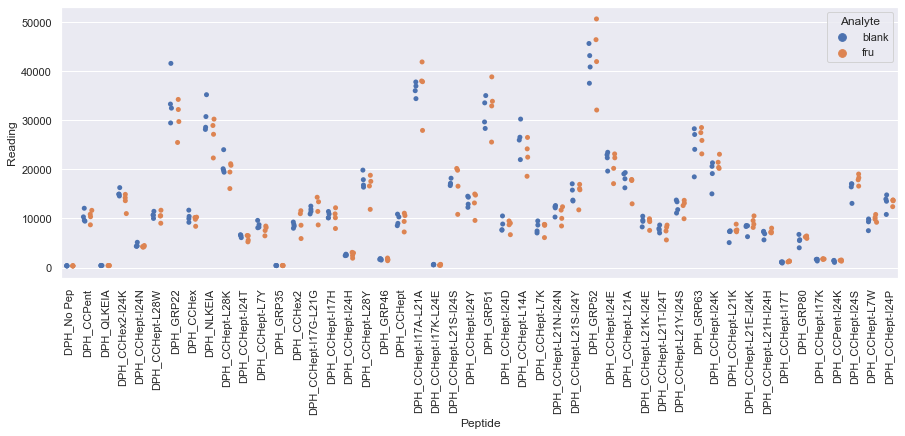

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_1.xlsx
Drawing scatter plot of data spread for glu_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

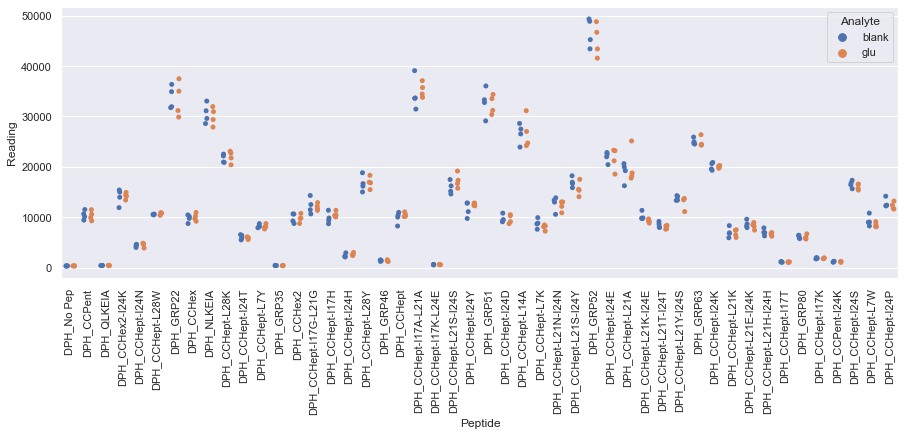

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_1.xlsx
Drawing scatter plot of data spread for gluam_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

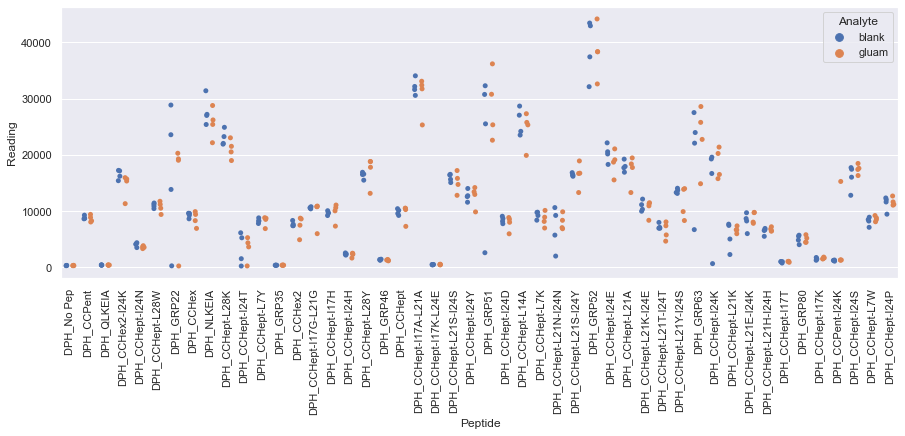

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_1.xlsx
Drawing scatter plot of data spread for mal_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

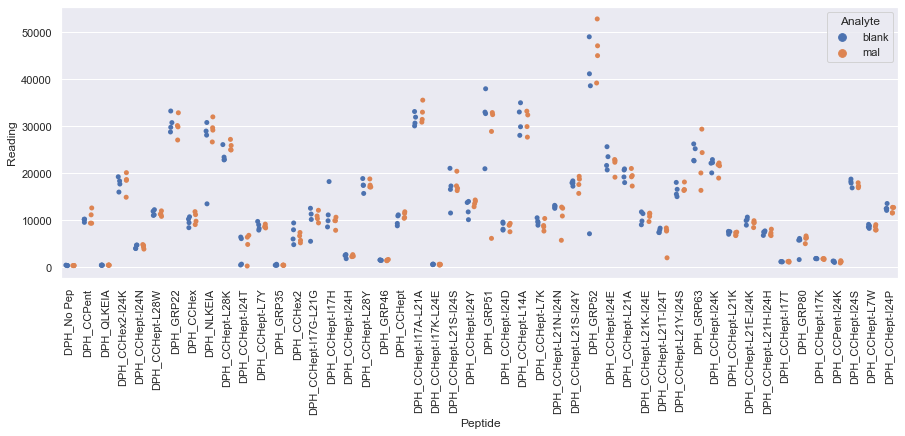

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_1.xlsx
Drawing scatter plot of data spread for man_repeat_1 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

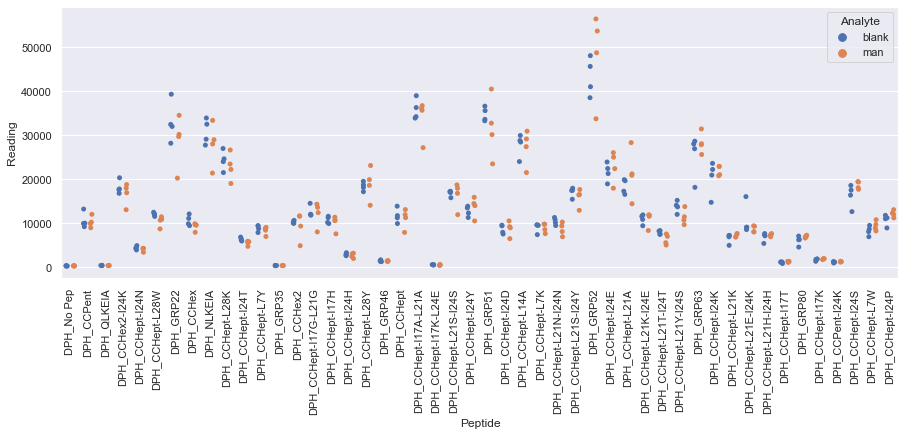

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_2.xlsx
Drawing scatter plot of data spread for fru_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

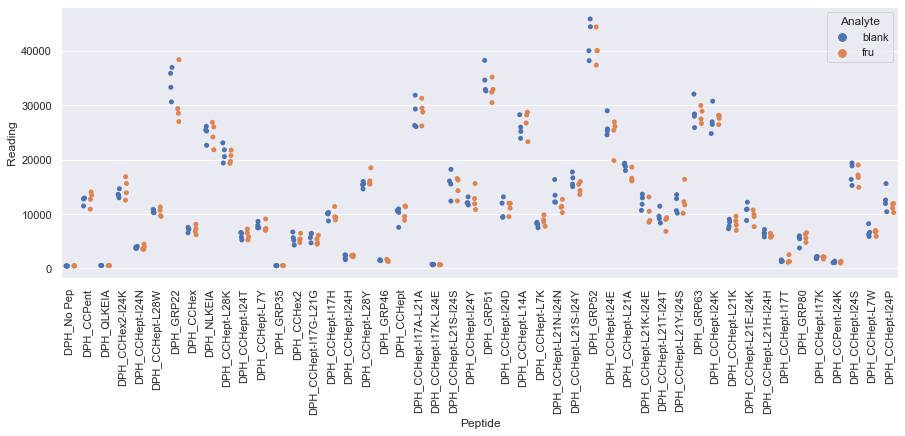

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_2.xlsx
Drawing scatter plot of data spread for glu_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

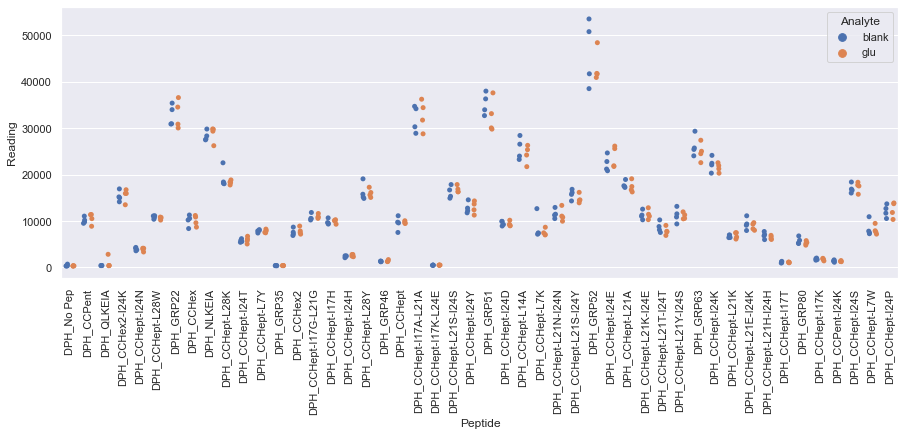

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_2.xlsx
Drawing scatter plot of data spread for gluam_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

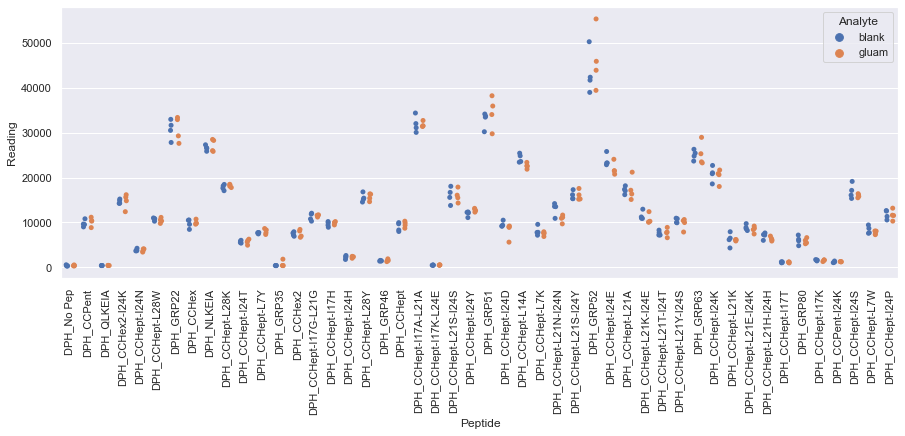

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_2.xlsx
Drawing scatter plot of data spread for mal_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

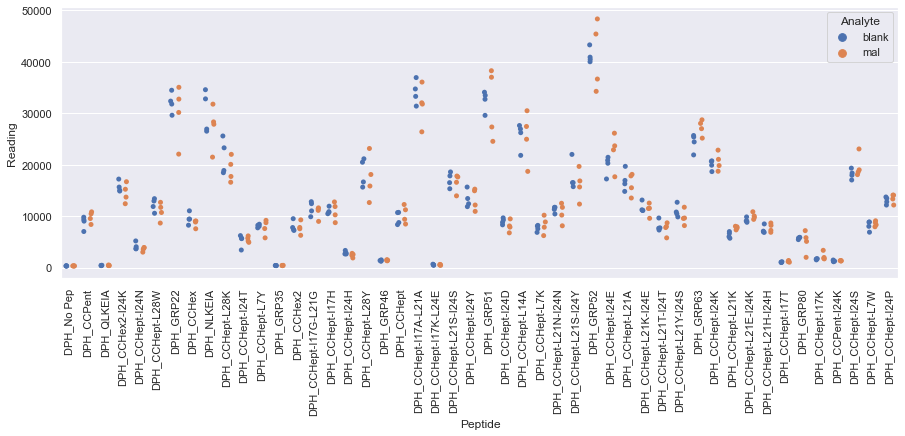

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_2.xlsx
Drawing scatter plot of data spread for man_repeat_2 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

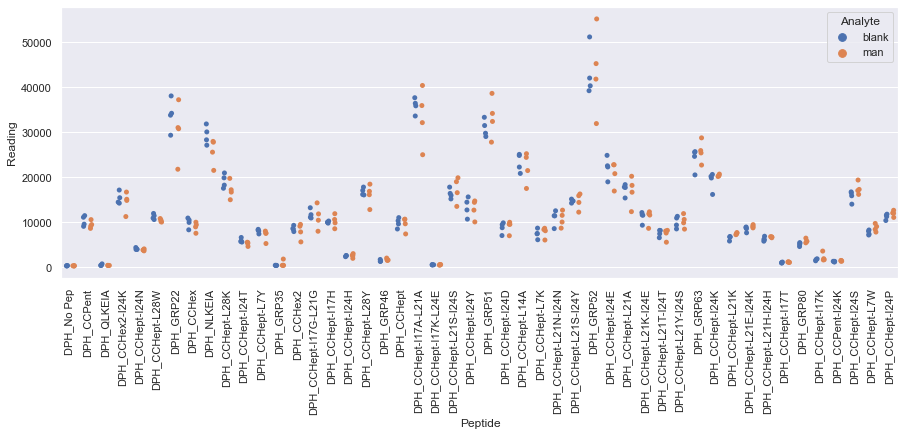

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_3.xlsx
Drawing scatter plot of data spread for fru_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

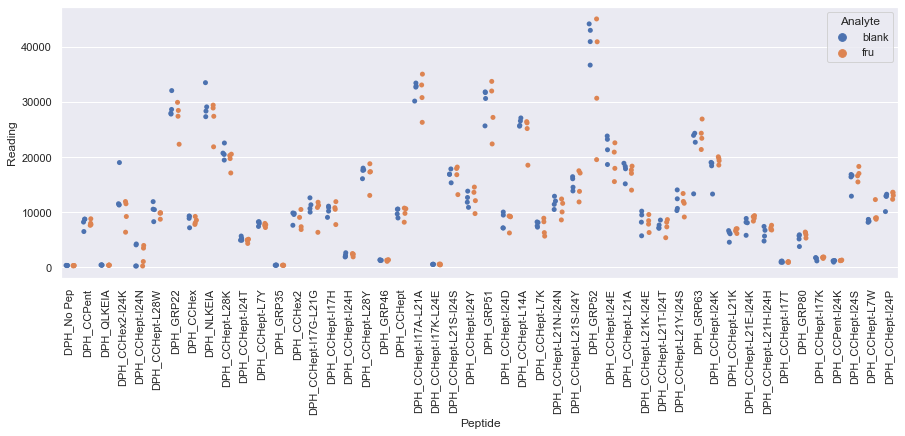

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_3.xlsx
Drawing scatter plot of data spread for glu_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

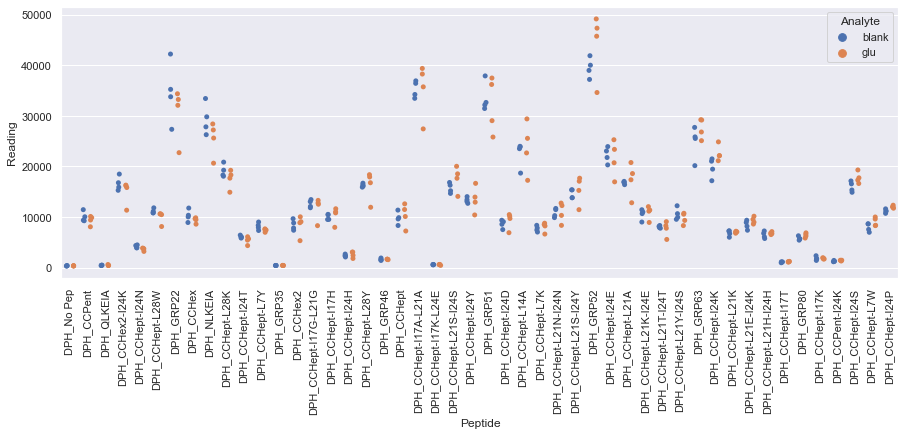

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_3.xlsx
Drawing scatter plot of data spread for gluam_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

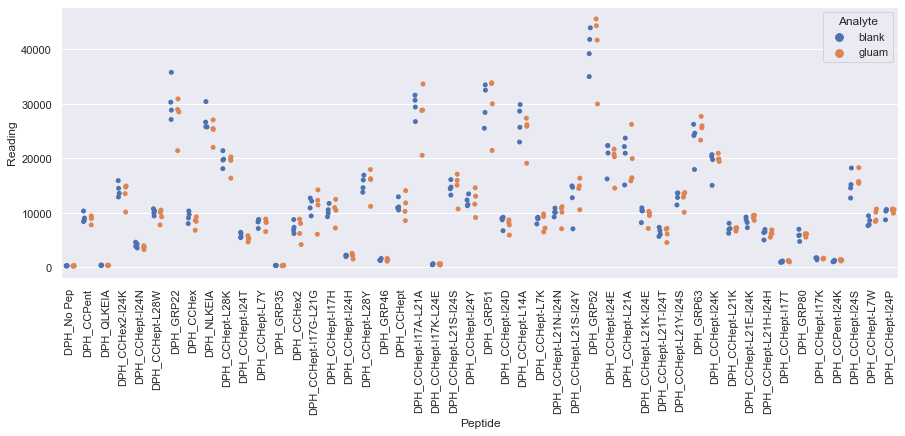

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_3.xlsx
Drawing scatter plot of data spread for mal_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

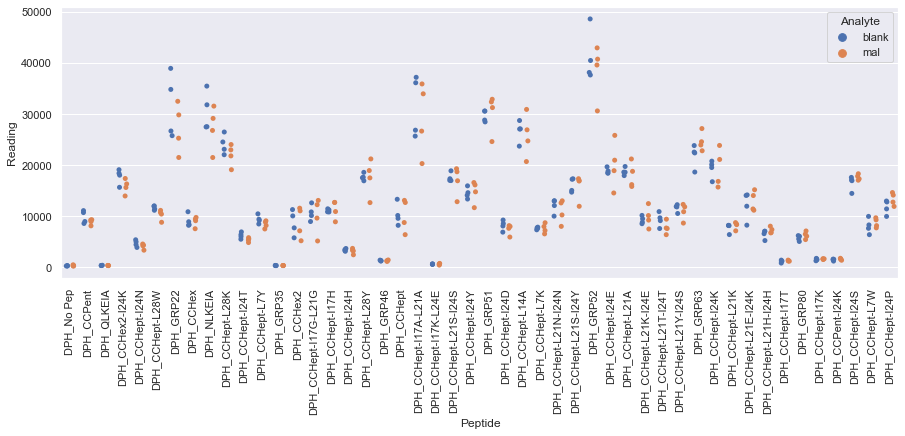

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_3.xlsx
Drawing scatter plot of data spread for man_repeat_3 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

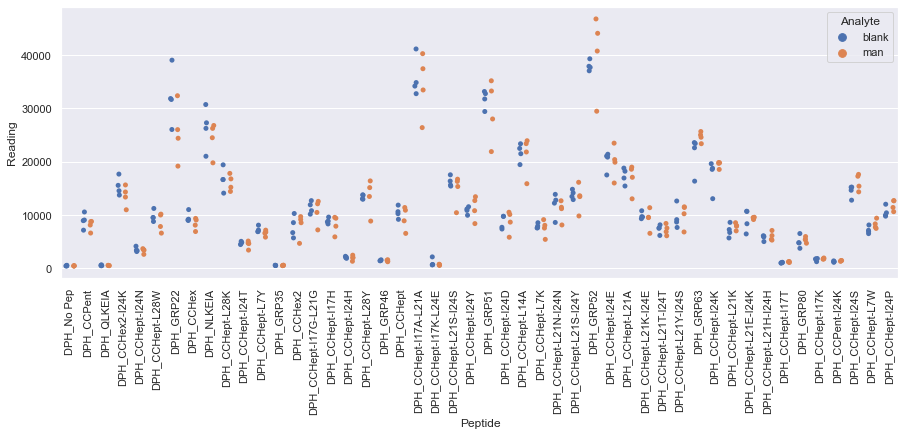

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_4.xlsx
Drawing scatter plot of data spread for fru_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

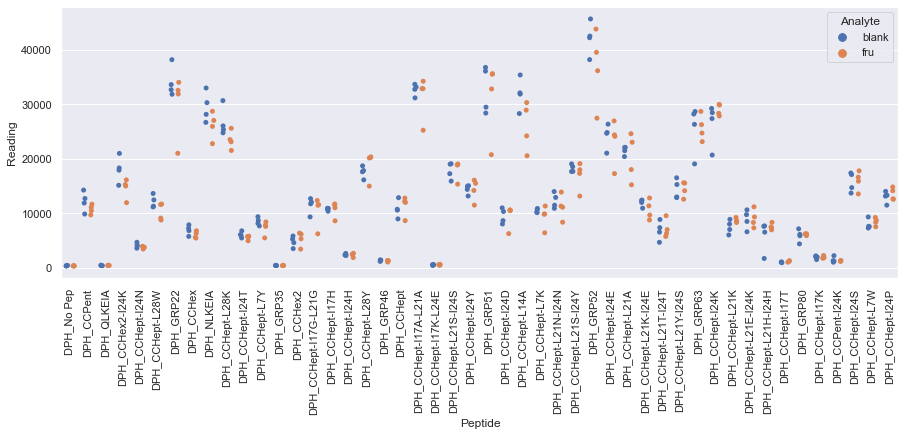

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_4.xlsx
Drawing scatter plot of data spread for glu_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

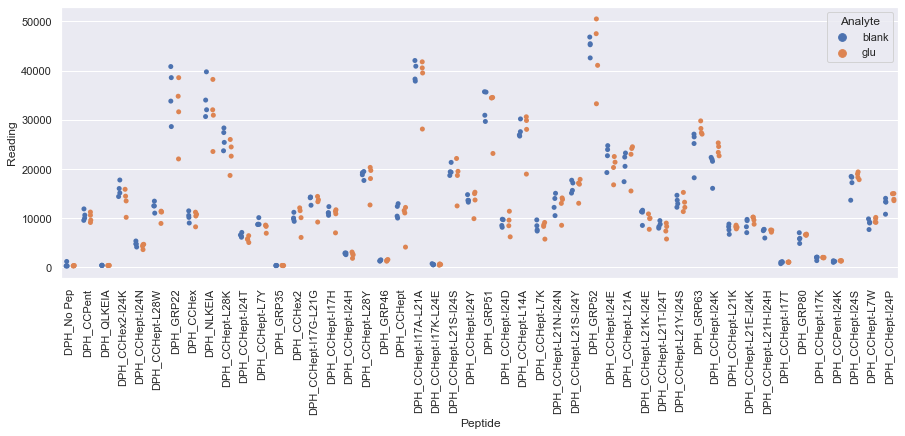

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_4.xlsx
Drawing scatter plot of data spread for gluam_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

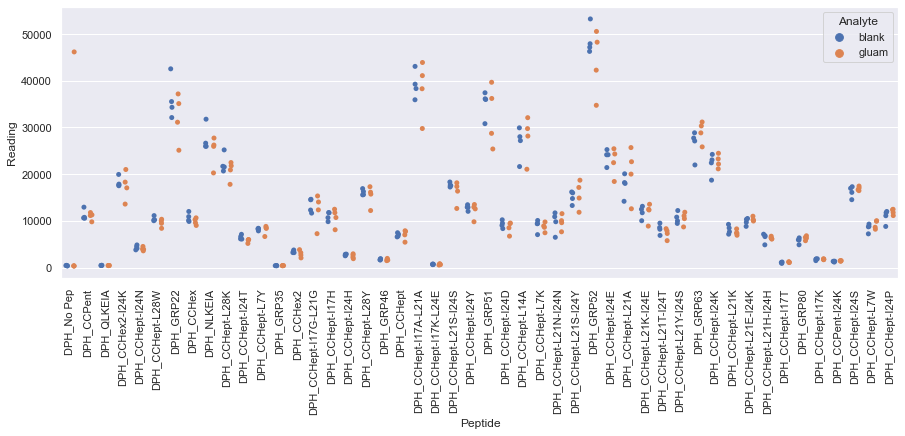

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_4.xlsx
Drawing scatter plot of data spread for mal_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

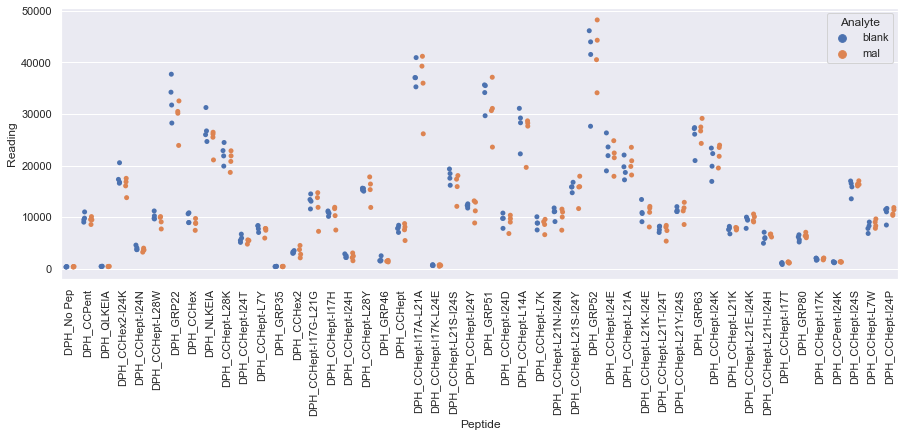

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_4.xlsx
Drawing scatter plot of data spread for man_repeat_4 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

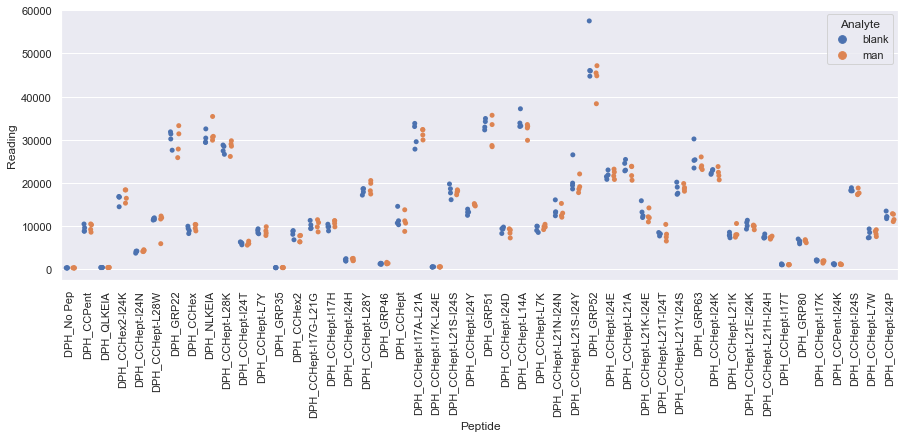

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_5.xlsx
Drawing scatter plot of data spread for fru_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

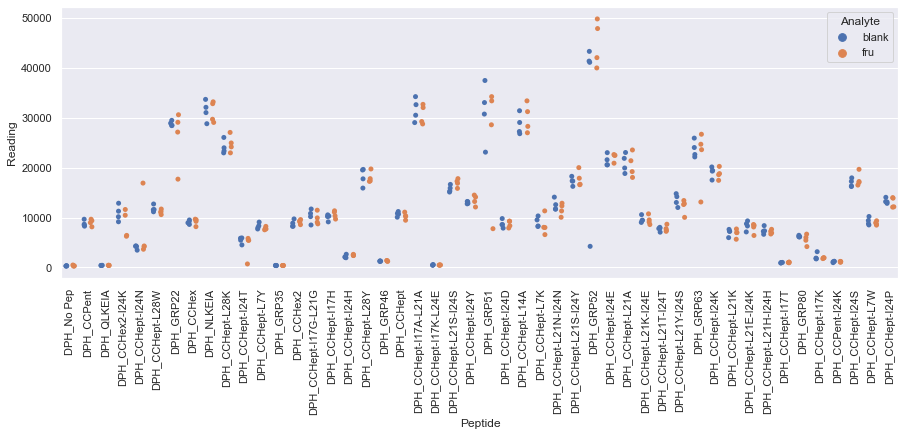

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_5.xlsx
Drawing scatter plot of data spread for glu_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

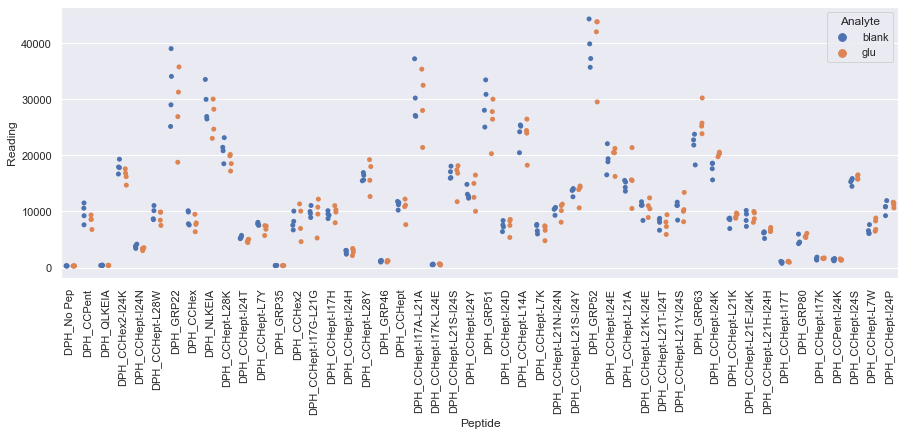

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_5.xlsx
Drawing scatter plot of data spread for gluam_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

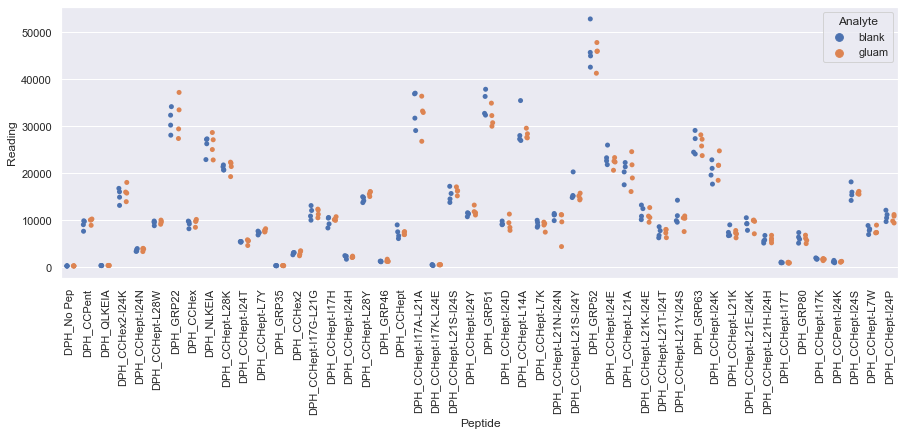

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_5.xlsx
Drawing scatter plot of data spread for mal_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

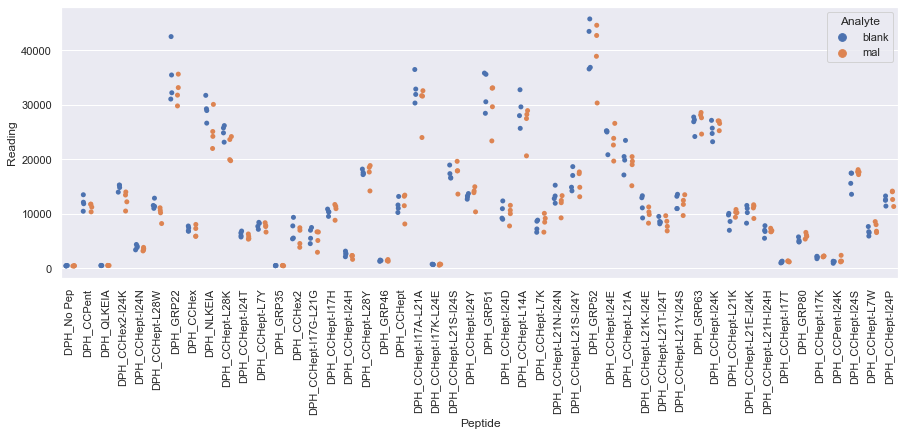

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_5.xlsx
Drawing scatter plot of data spread for man_repeat_5 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

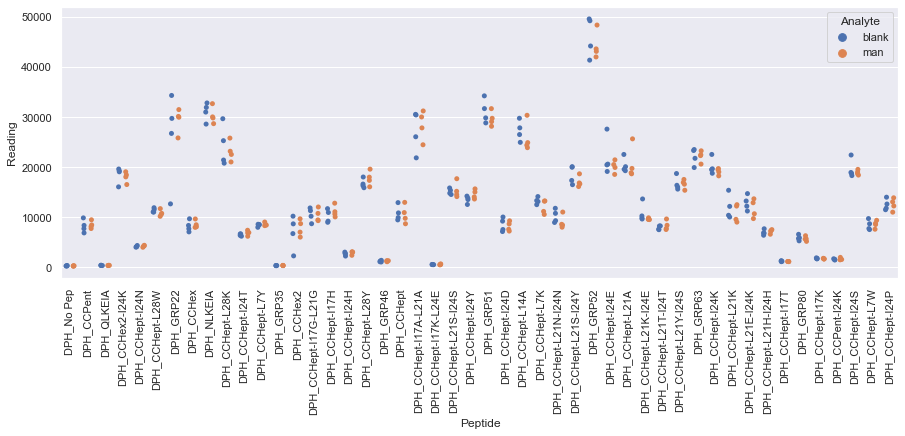

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_6.xlsx
Drawing scatter plot of data spread for fru_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

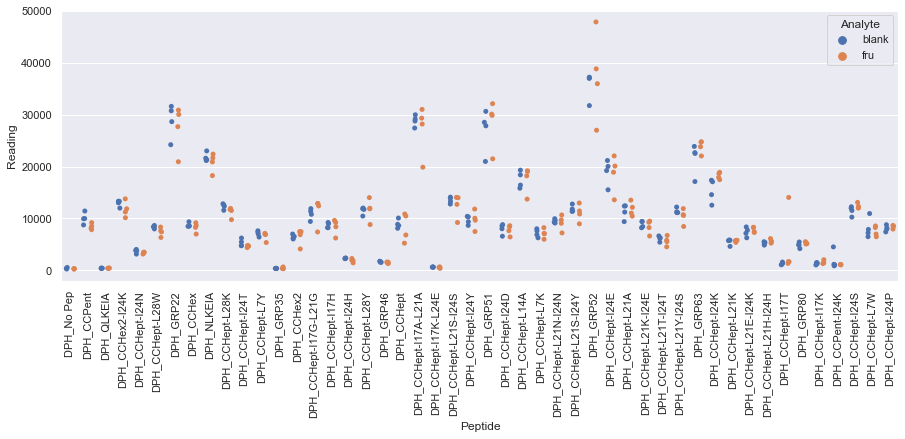

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_6.xlsx
Drawing scatter plot of data spread for glu_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

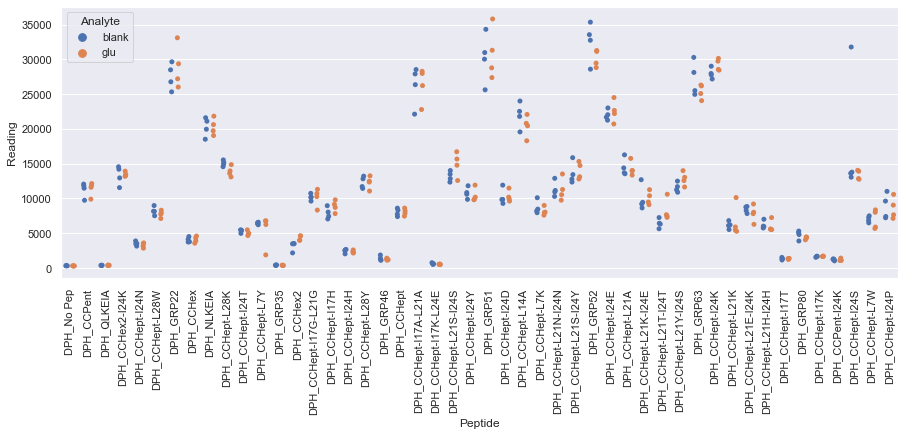

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_6.xlsx
Drawing scatter plot of data spread for gluam_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

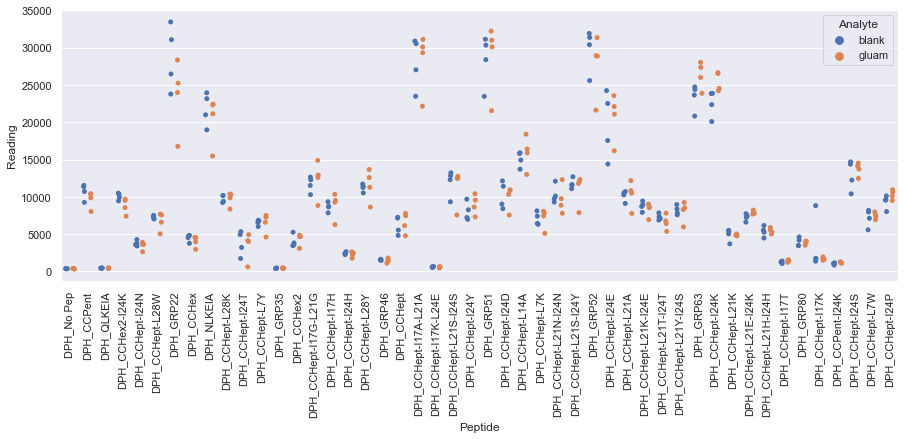

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_6.xlsx
Drawing scatter plot of data spread for mal_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

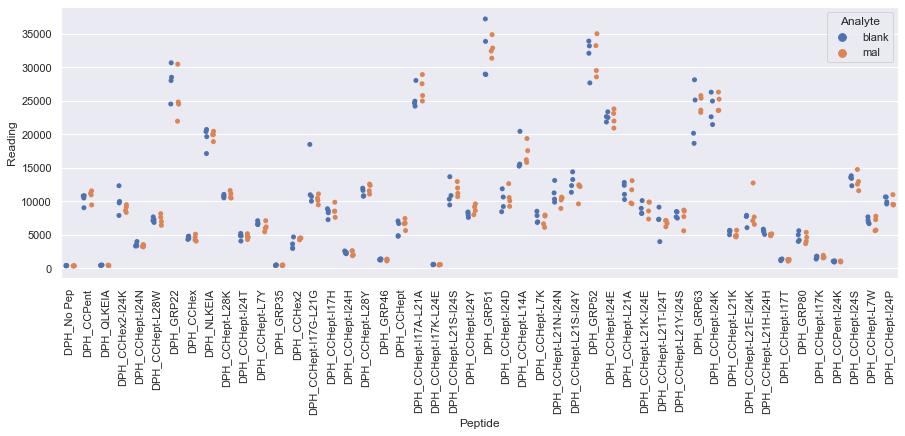

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_6.xlsx
Drawing scatter plot of data spread for man_repeat_6 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

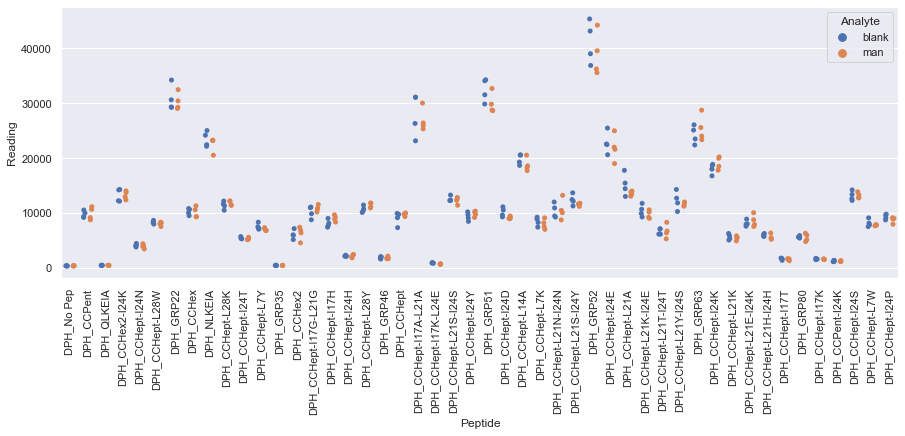

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_7.xlsx
Drawing scatter plot of data spread for fru_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

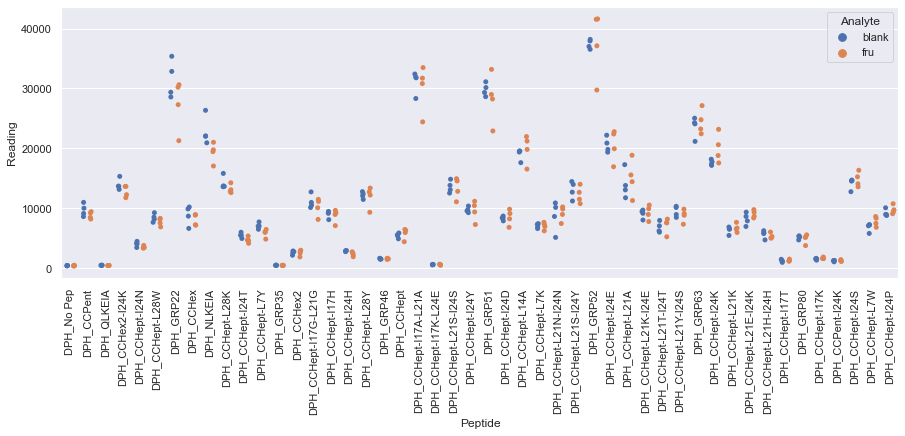

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_7.xlsx
Drawing scatter plot of data spread for glu_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

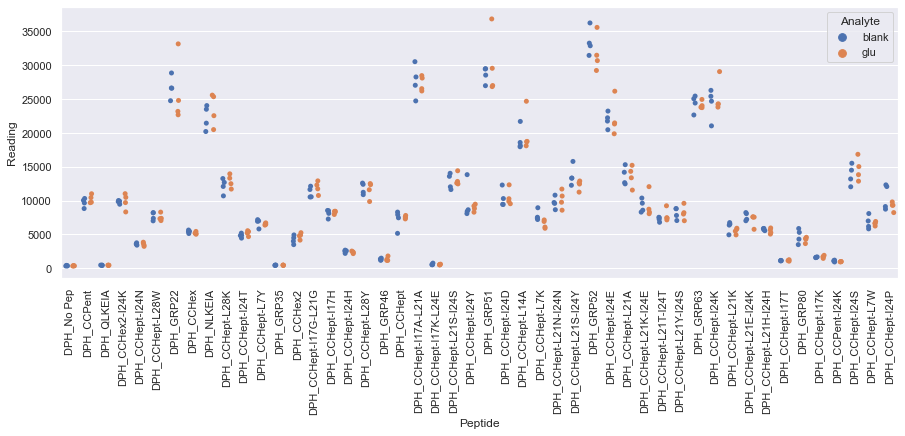

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_7.xlsx
Drawing scatter plot of data spread for gluam_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

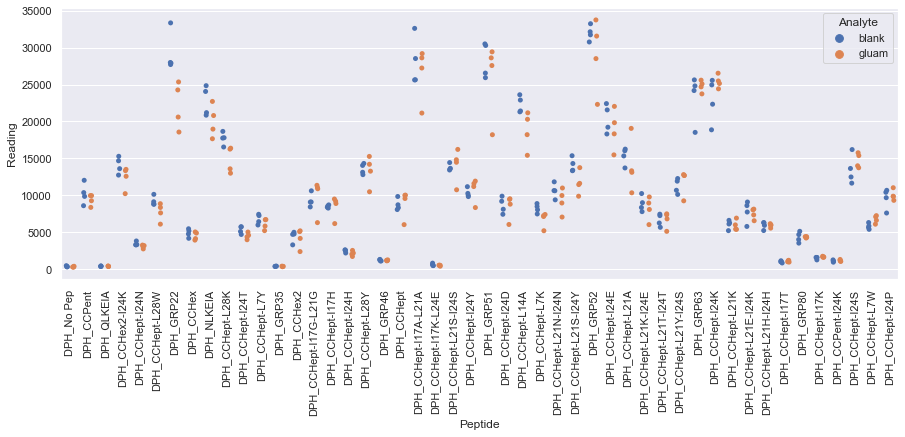

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_7.xlsx
Drawing scatter plot of data spread for mal_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

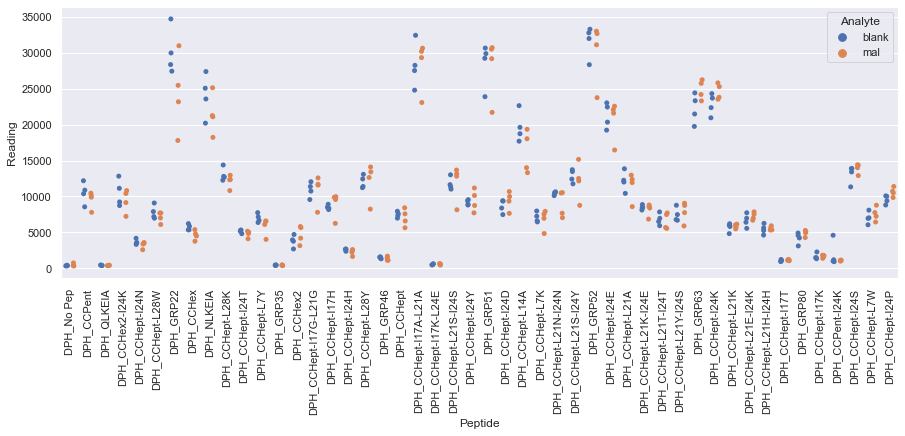

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_7.xlsx
Drawing scatter plot of data spread for man_repeat_7 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

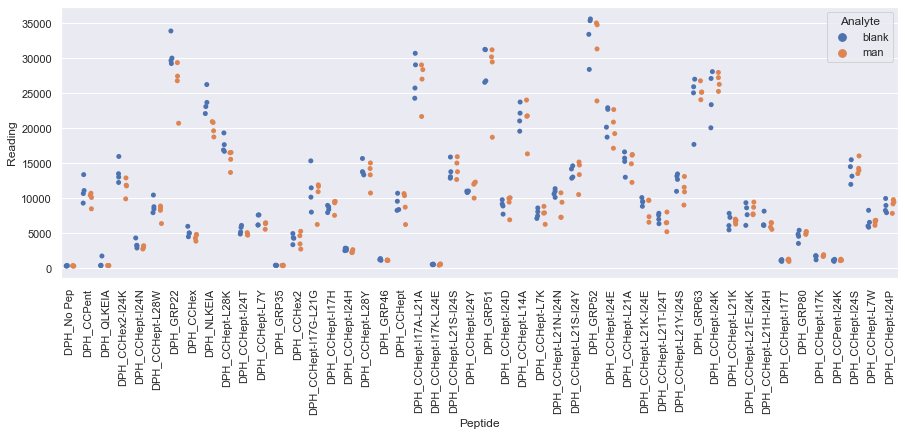

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_8.xlsx
Drawing scatter plot of data spread for fru_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

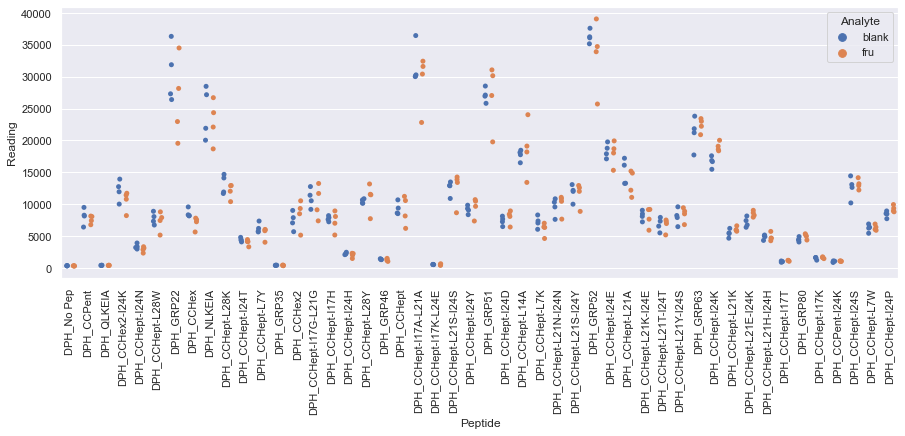

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_8.xlsx
Drawing scatter plot of data spread for glu_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

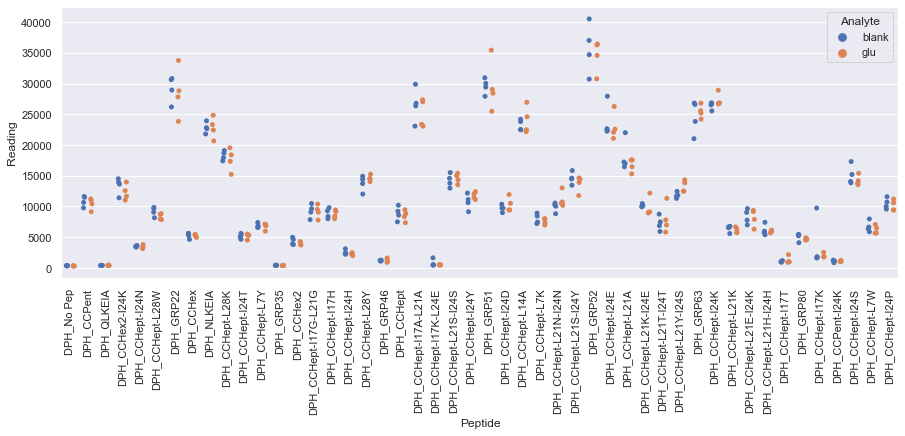

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_8.xlsx
Drawing scatter plot of data spread for gluam_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

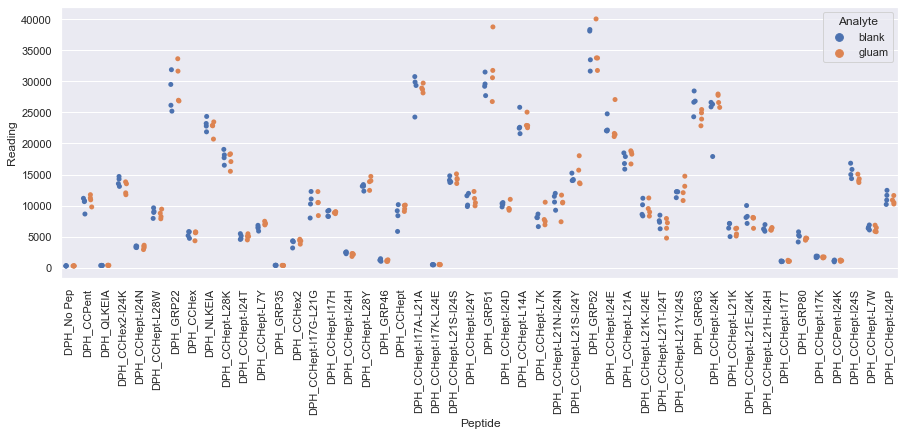

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_8.xlsx
Drawing scatter plot of data spread for mal_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

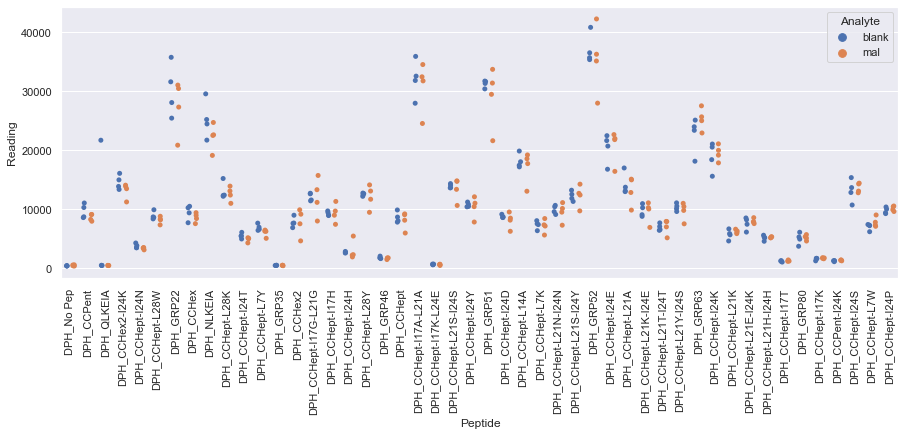

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_8.xlsx
Drawing scatter plot of data spread for man_repeat_8 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

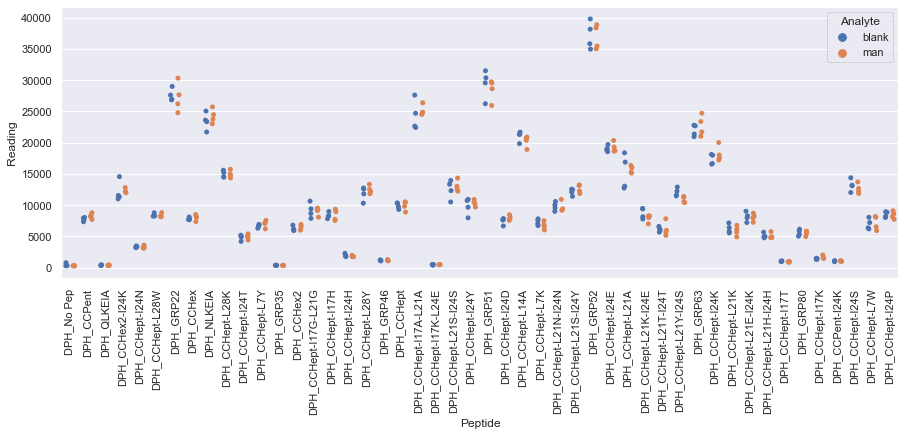

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_9.xlsx
Drawing scatter plot of data spread for fru_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

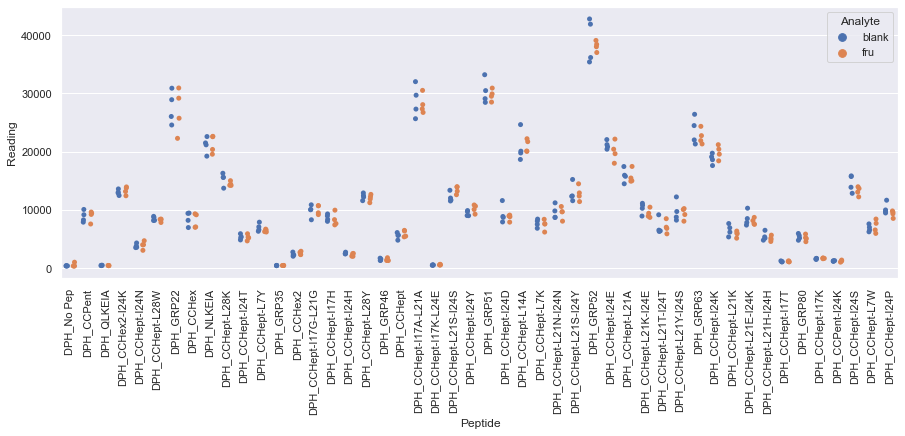

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_9.xlsx
Drawing scatter plot of data spread for glu_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

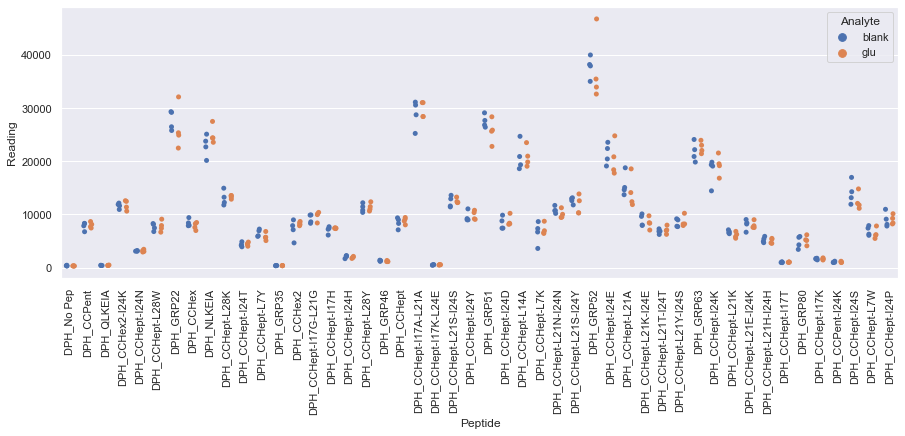

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_9.xlsx
Drawing scatter plot of data spread for gluam_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

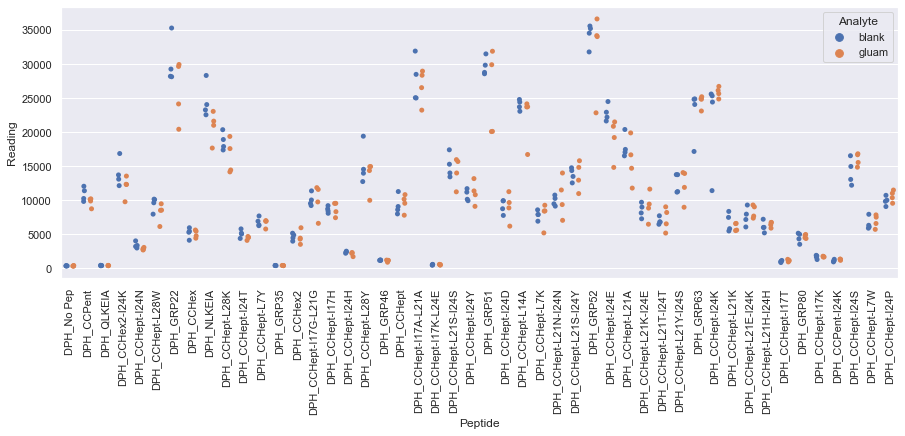

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_9.xlsx
Drawing scatter plot of data spread for mal_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

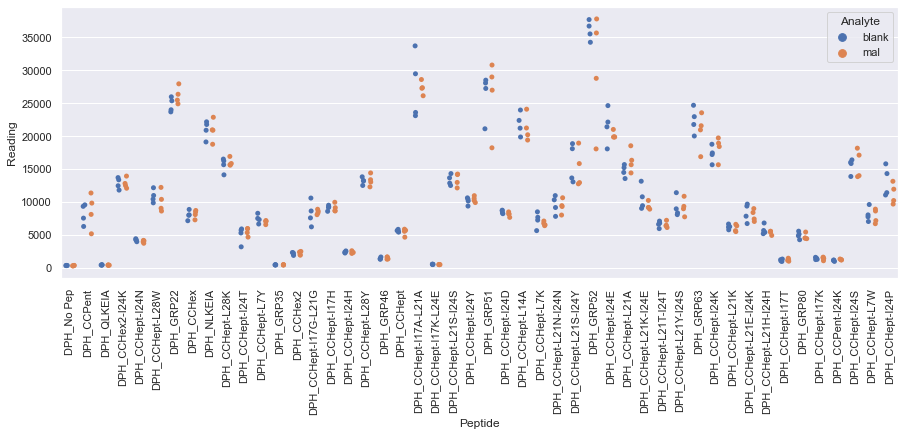

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_9.xlsx
Drawing scatter plot of data spread for man_repeat_9 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

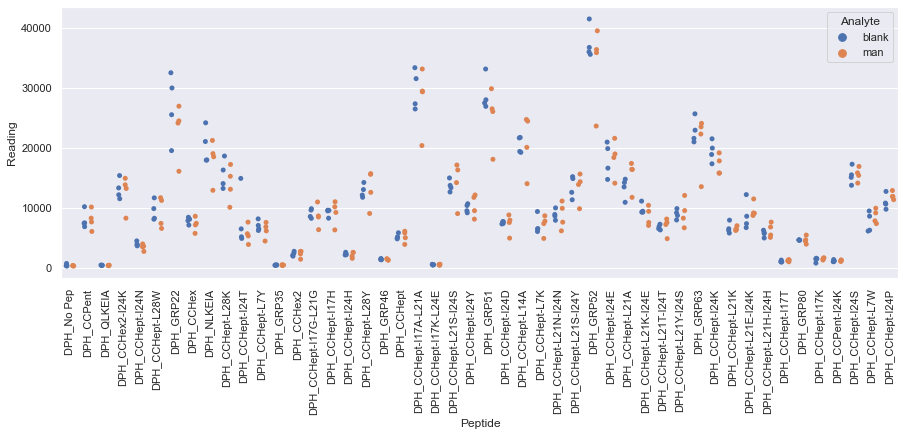

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_10.xlsx
Drawing scatter plot of data spread for fru_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

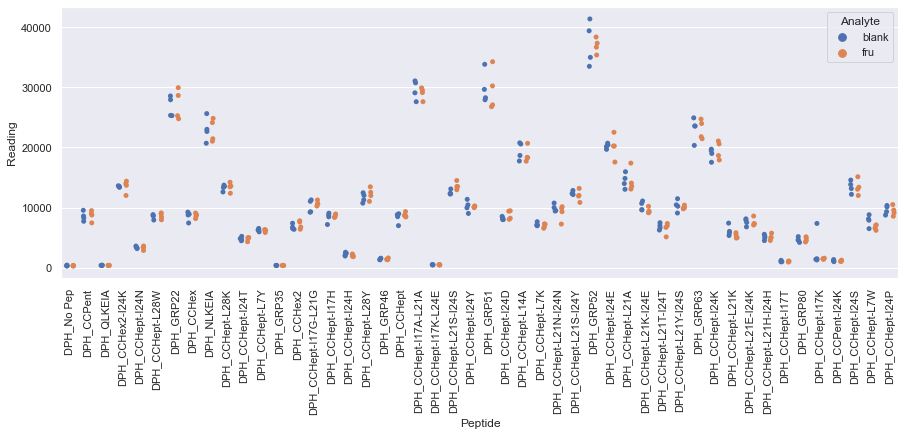

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/glu_repeat_10.xlsx
Drawing scatter plot of data spread for glu_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

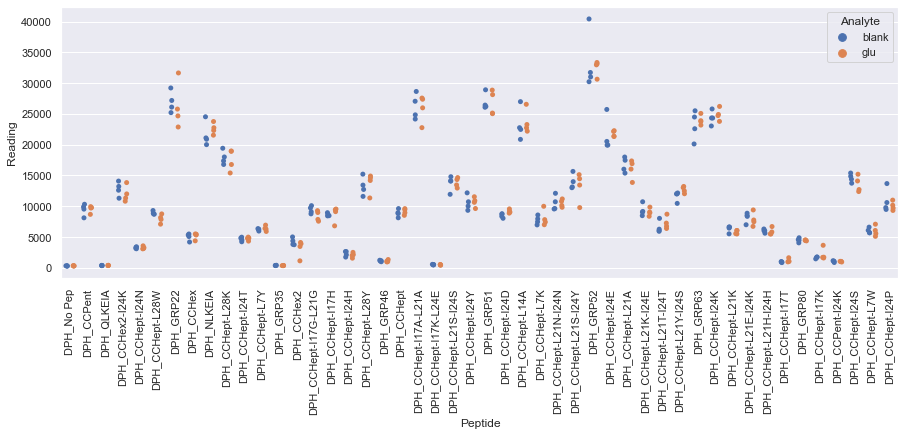

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/gluam_repeat_10.xlsx
Drawing scatter plot of data spread for gluam_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

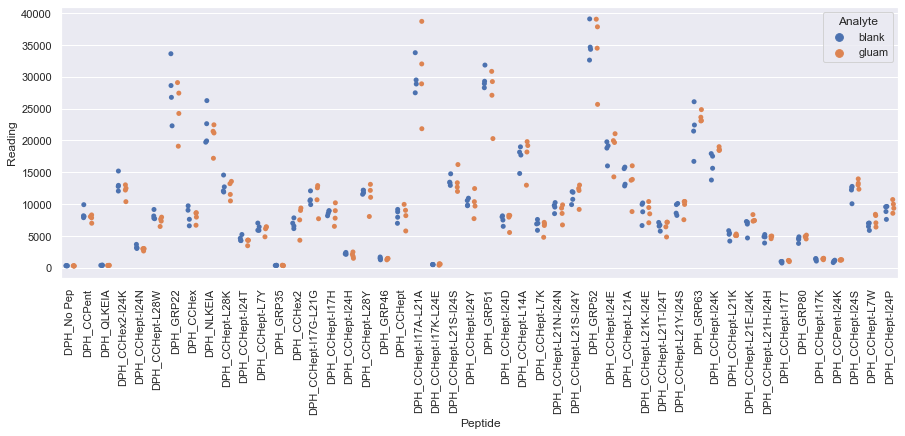

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_10.xlsx
Drawing scatter plot of data spread for mal_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

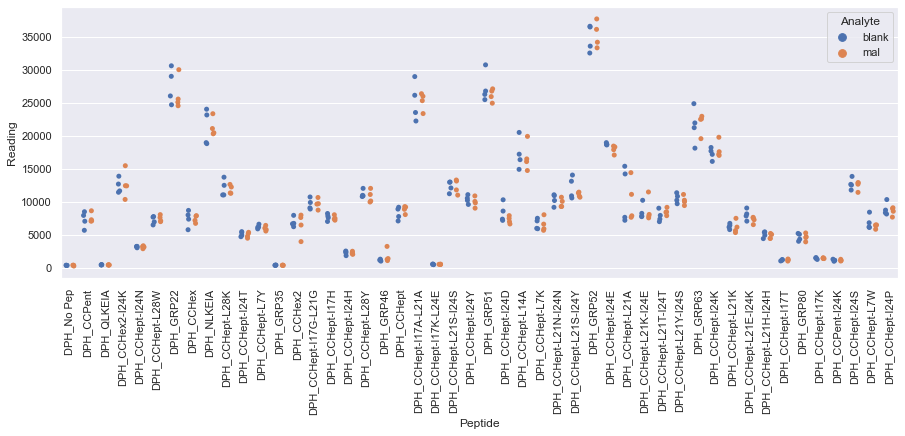

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/man_repeat_10.xlsx
Drawing scatter plot of data spread for man_repeat_10 in Sugar_unscaled_data


<Figure size 720x720 with 0 Axes>

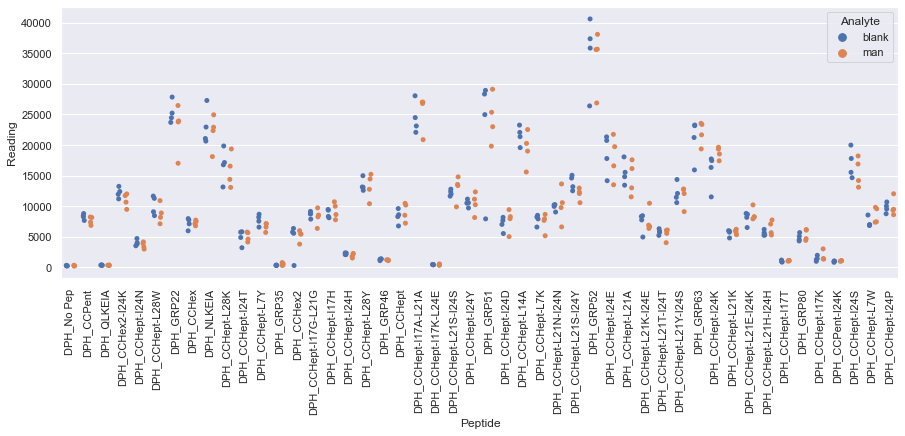

Drawing scatter plot of data spread for fru_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

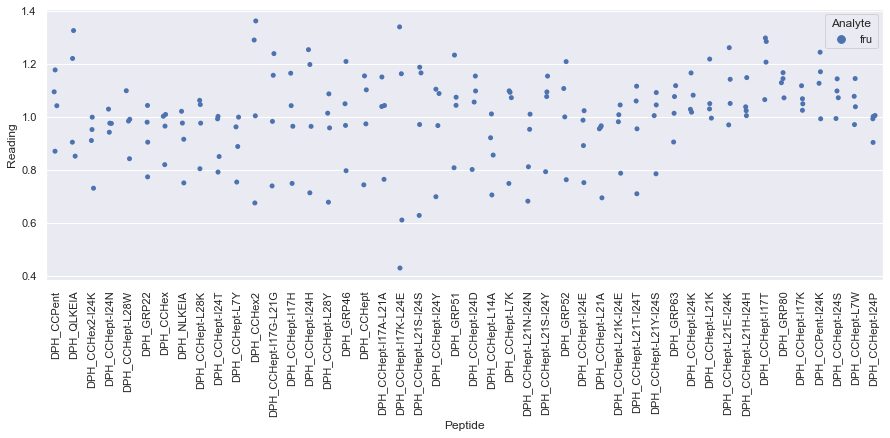

Drawing scatter plot of data spread for glu_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

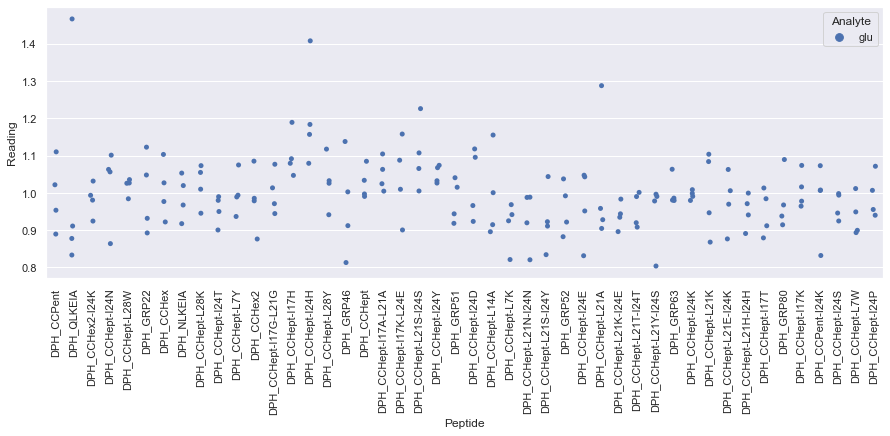

Drawing scatter plot of data spread for gluam_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

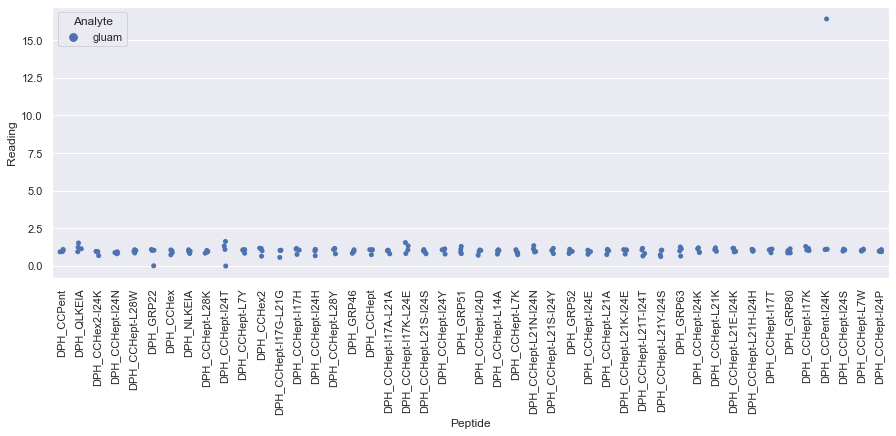

Drawing scatter plot of data spread for mal_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

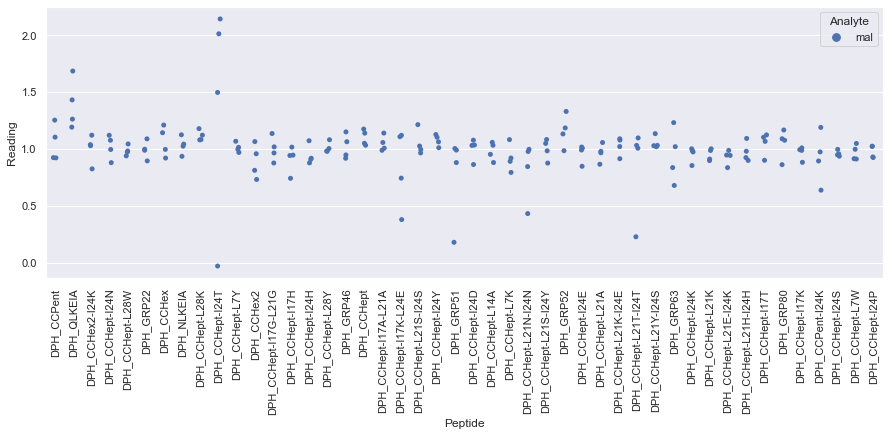

Drawing scatter plot of data spread for man_repeat_1 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

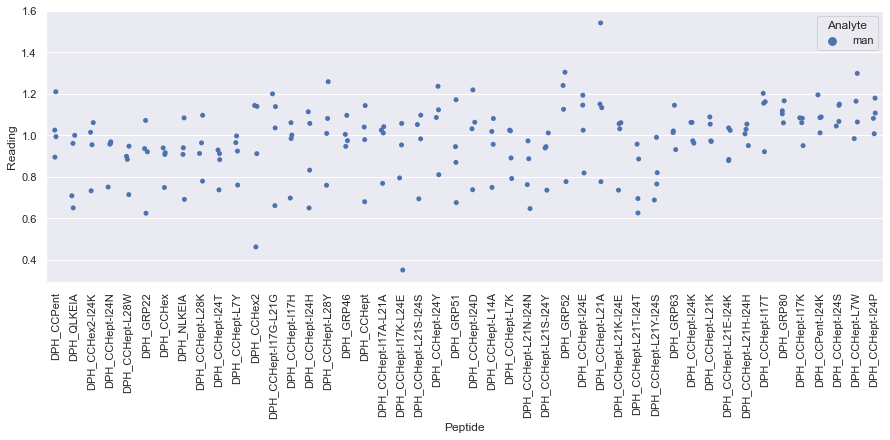

Drawing scatter plot of data spread for fru_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

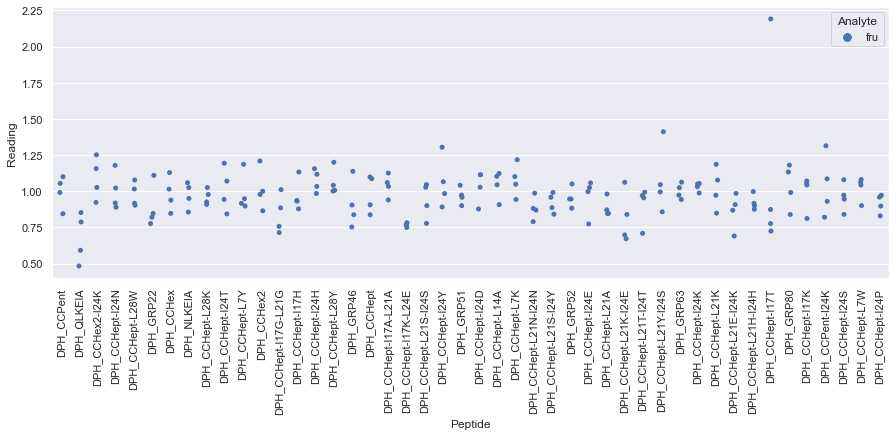

Drawing scatter plot of data spread for glu_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

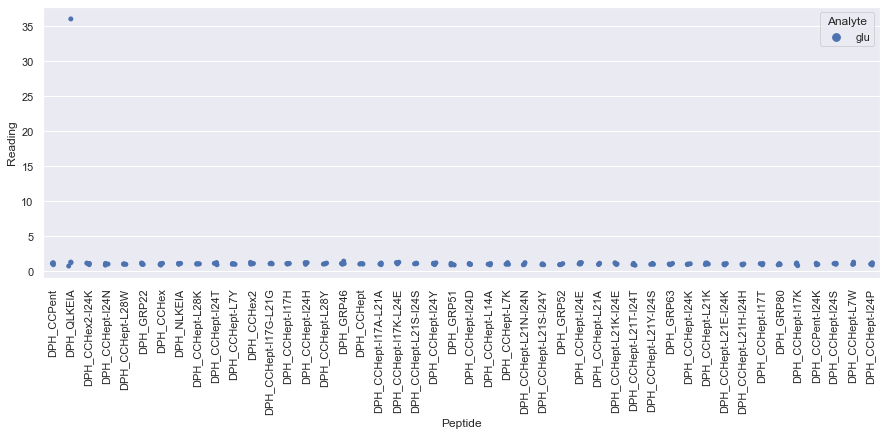

Drawing scatter plot of data spread for gluam_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

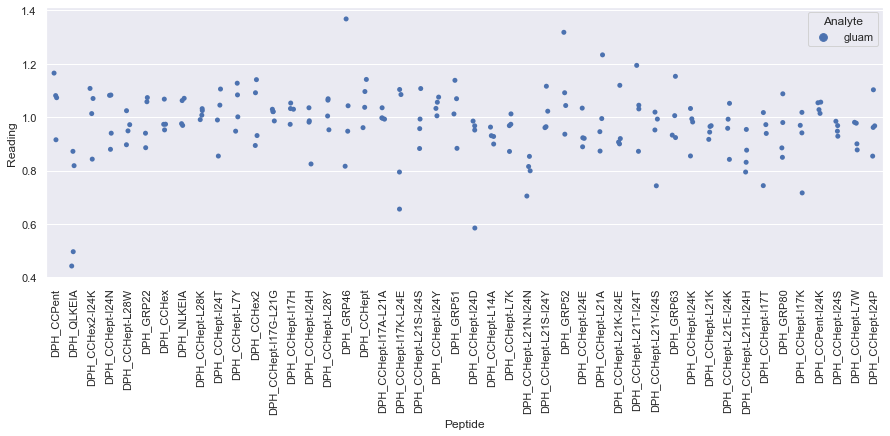

Drawing scatter plot of data spread for mal_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

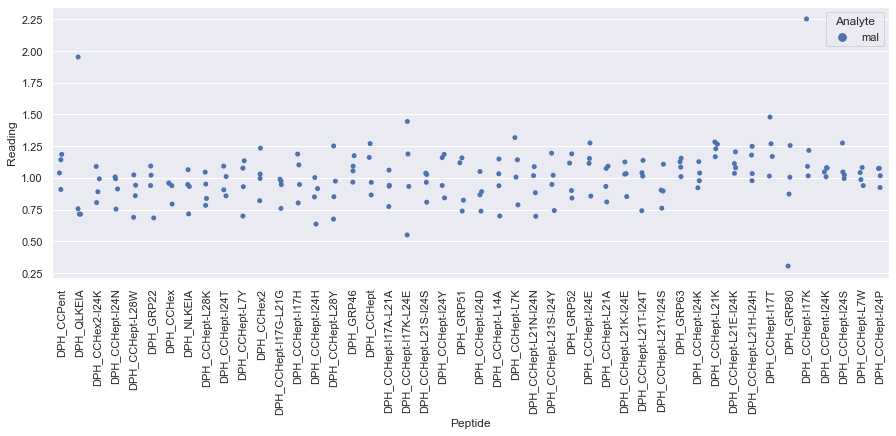

Drawing scatter plot of data spread for man_repeat_2 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

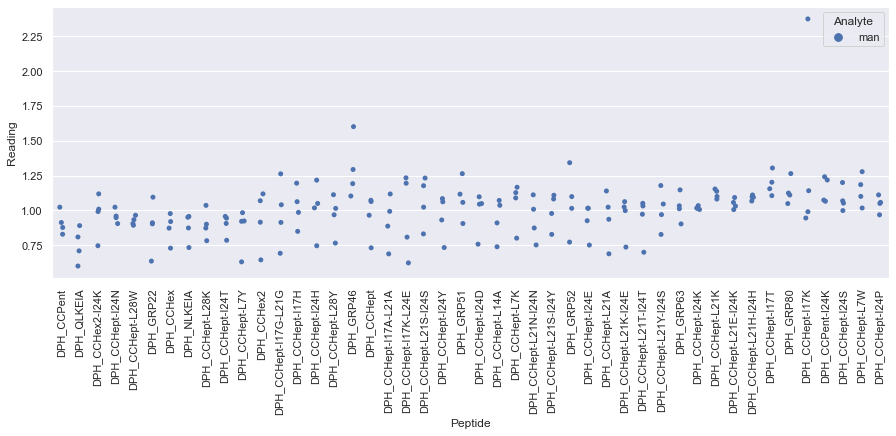

Drawing scatter plot of data spread for fru_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

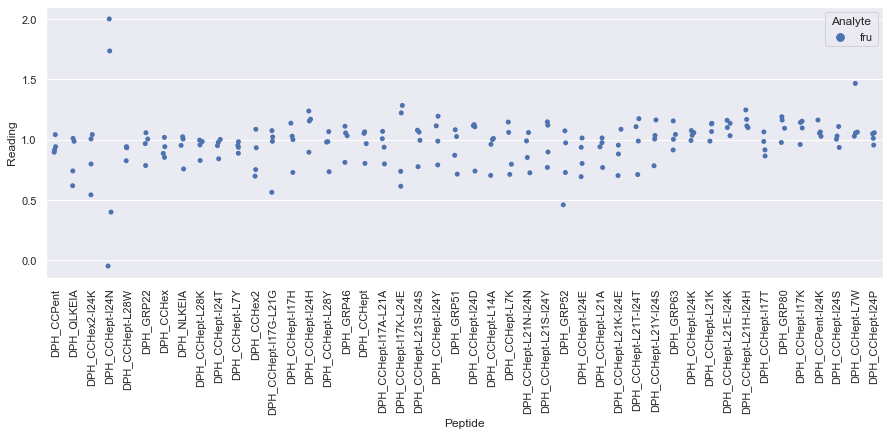

Drawing scatter plot of data spread for glu_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

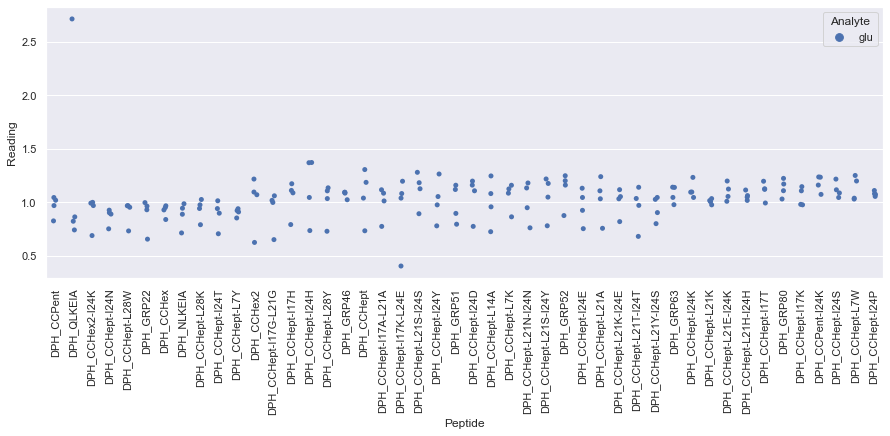

Drawing scatter plot of data spread for gluam_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

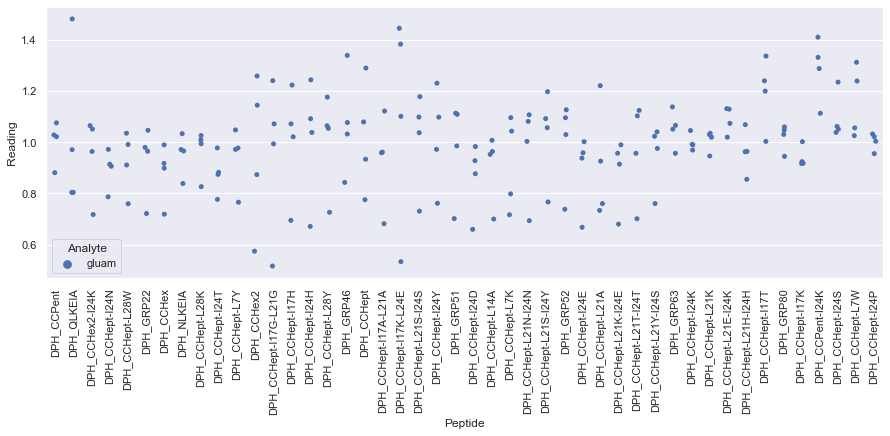

Drawing scatter plot of data spread for mal_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

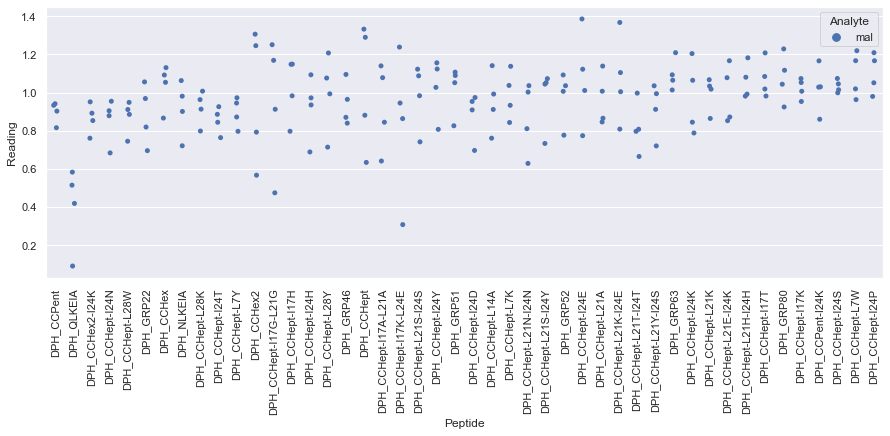

Drawing scatter plot of data spread for man_repeat_3 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

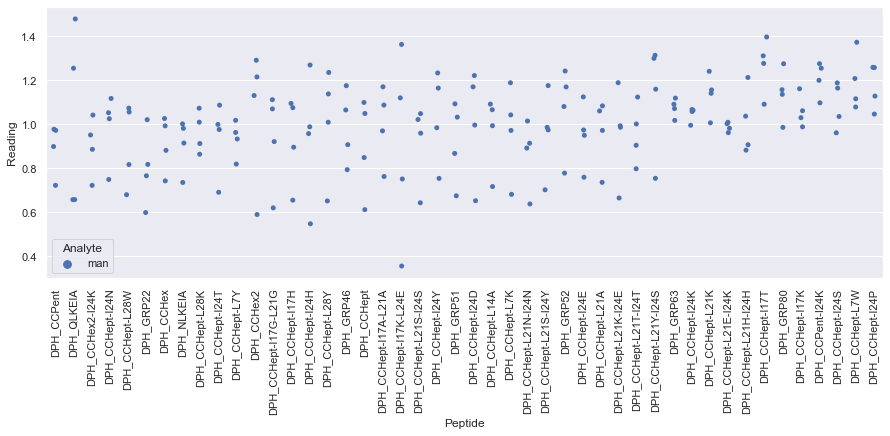

Drawing scatter plot of data spread for fru_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

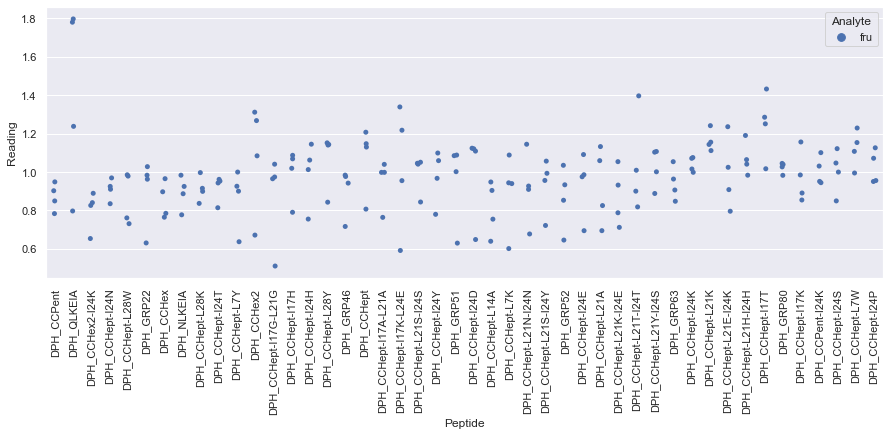

Drawing scatter plot of data spread for glu_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

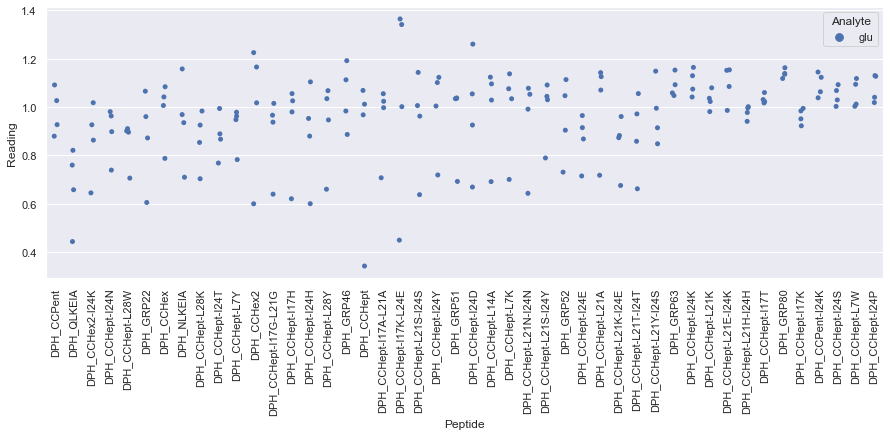

Drawing scatter plot of data spread for gluam_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

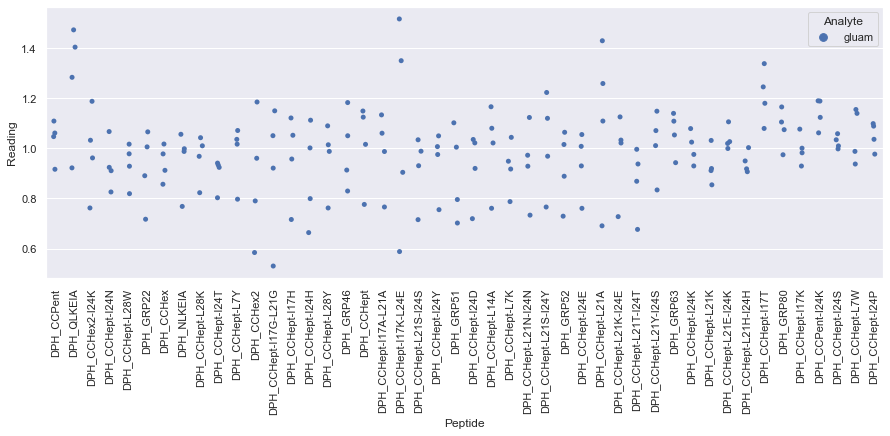

Drawing scatter plot of data spread for mal_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

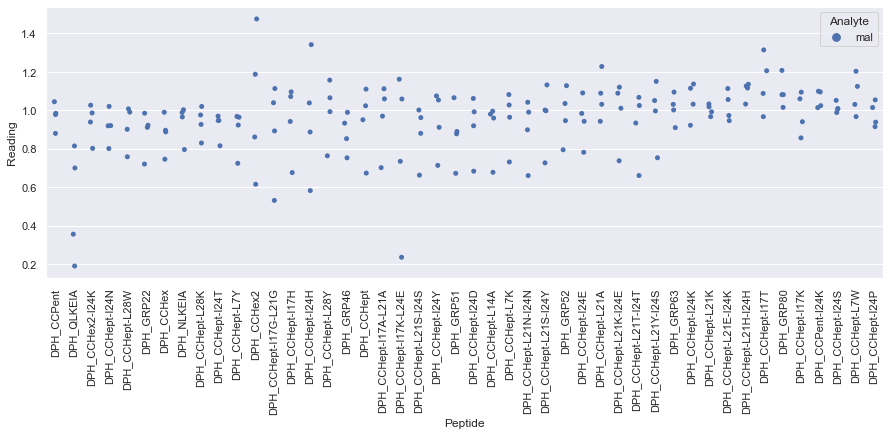

Drawing scatter plot of data spread for man_repeat_4 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

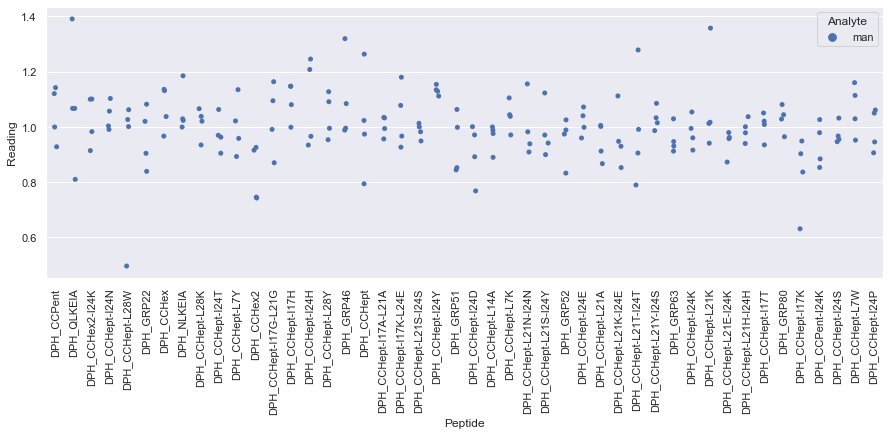

Drawing scatter plot of data spread for fru_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

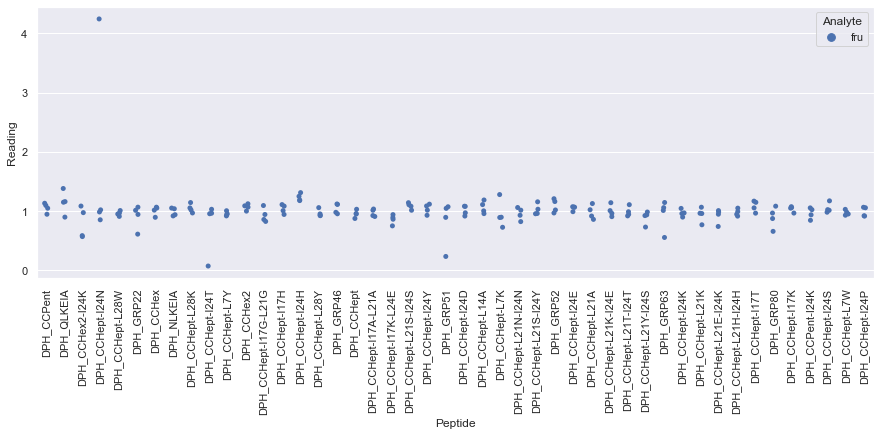

Drawing scatter plot of data spread for glu_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

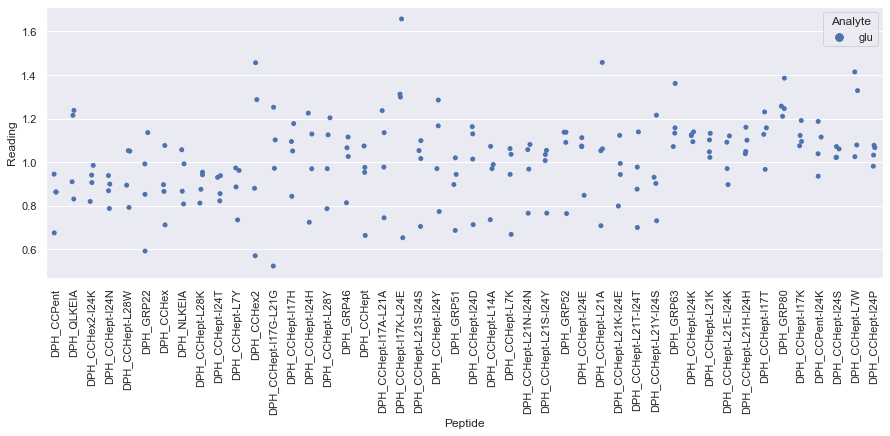

Drawing scatter plot of data spread for gluam_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

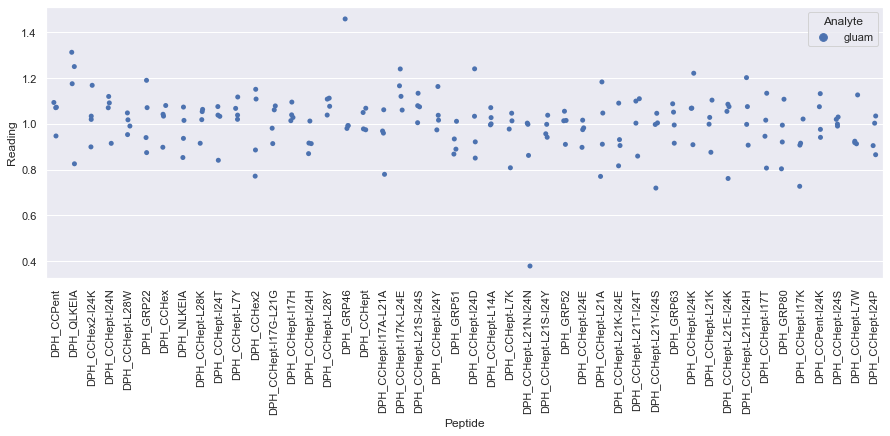

Drawing scatter plot of data spread for mal_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

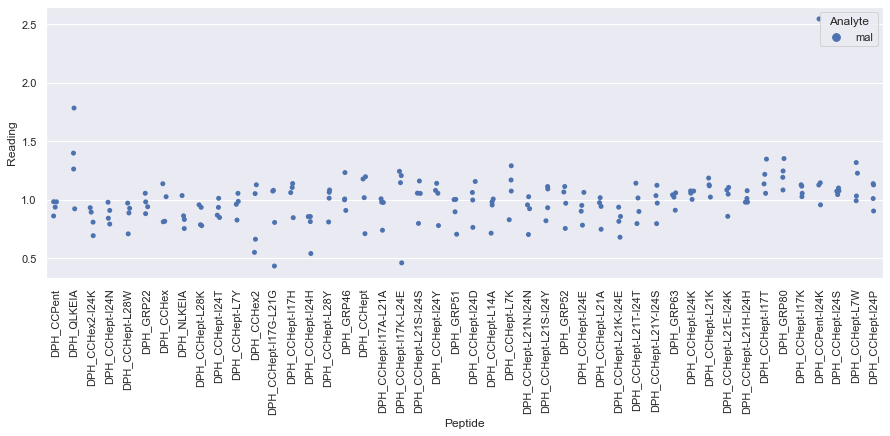

Drawing scatter plot of data spread for man_repeat_5 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

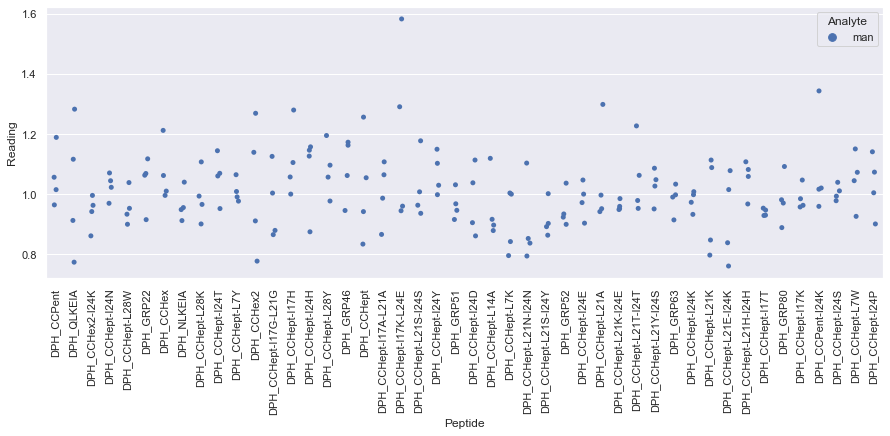

Drawing scatter plot of data spread for fru_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

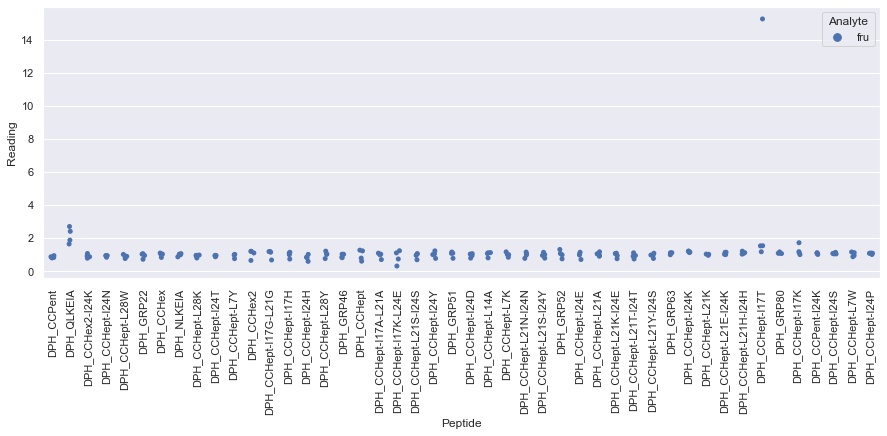

Drawing scatter plot of data spread for glu_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

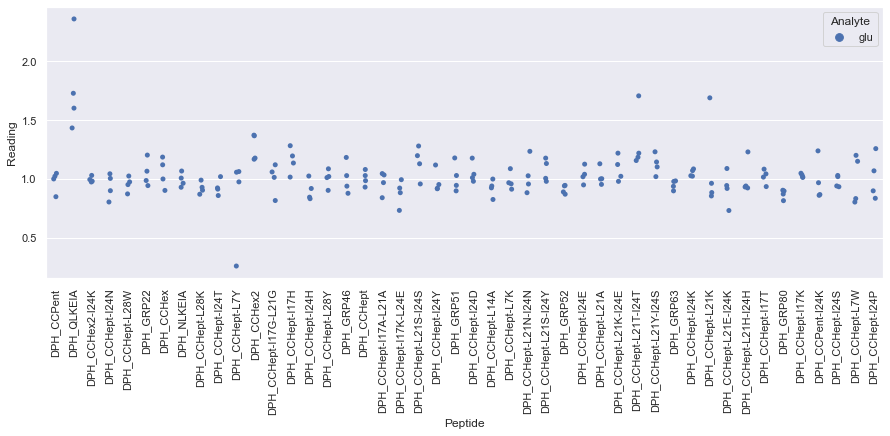

Drawing scatter plot of data spread for gluam_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

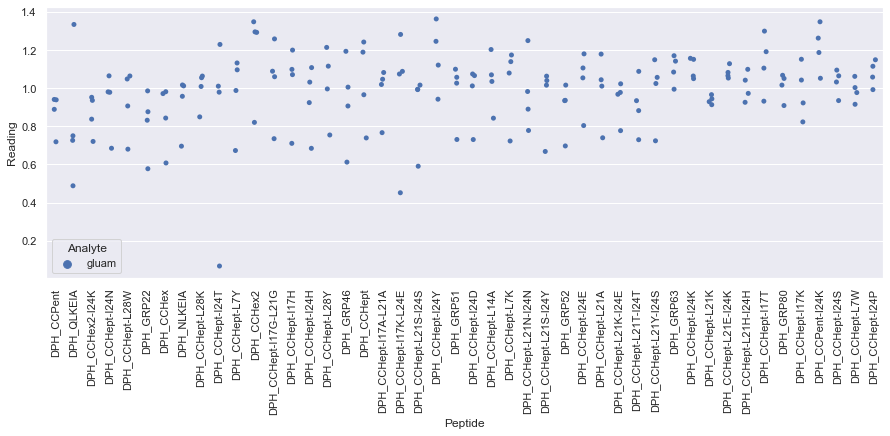

Drawing scatter plot of data spread for mal_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

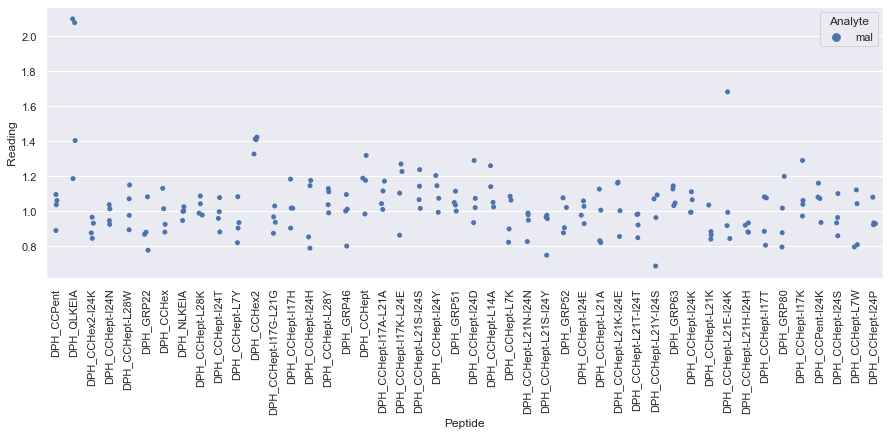

Drawing scatter plot of data spread for man_repeat_6 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

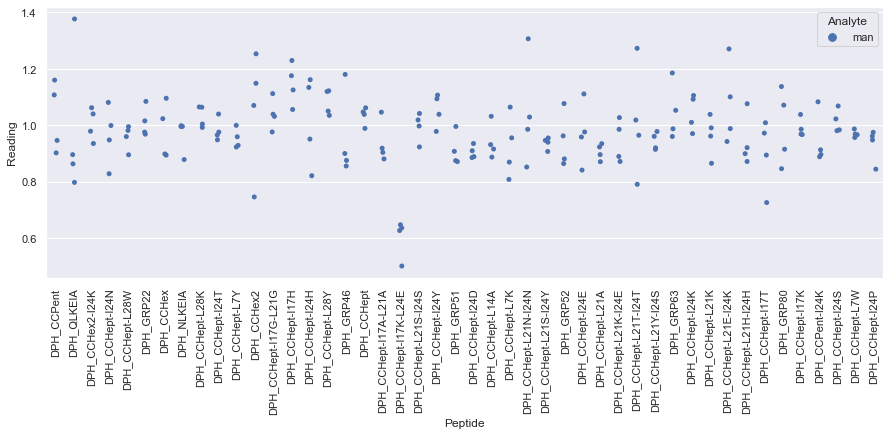

Drawing scatter plot of data spread for fru_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

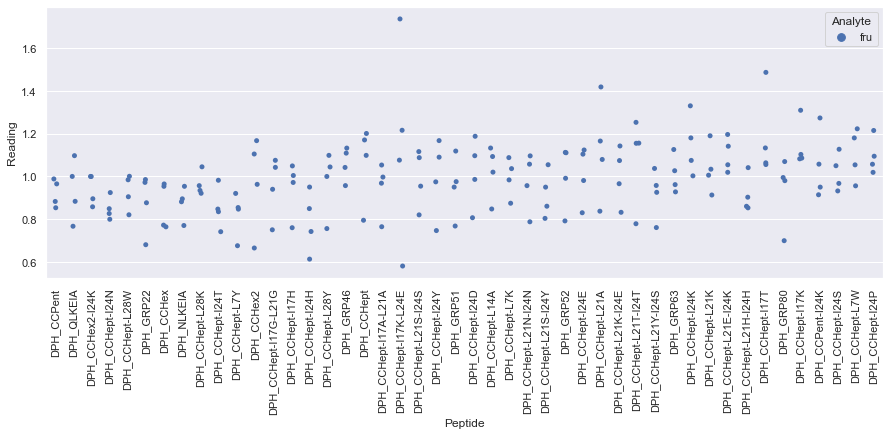

Drawing scatter plot of data spread for glu_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

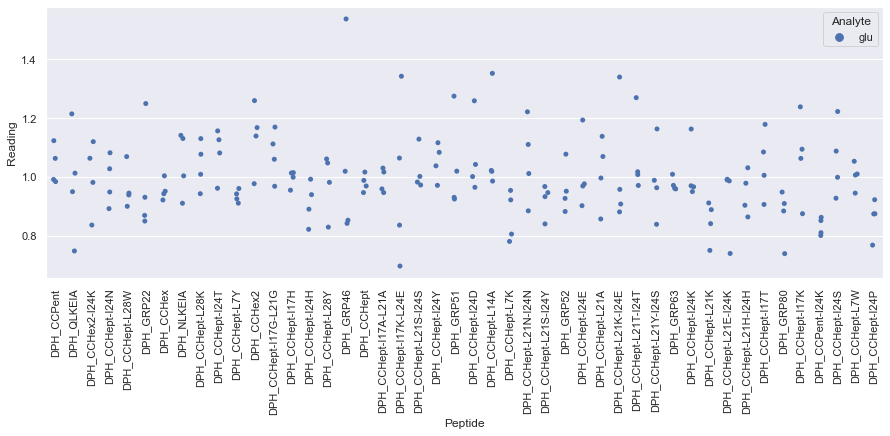

Drawing scatter plot of data spread for gluam_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

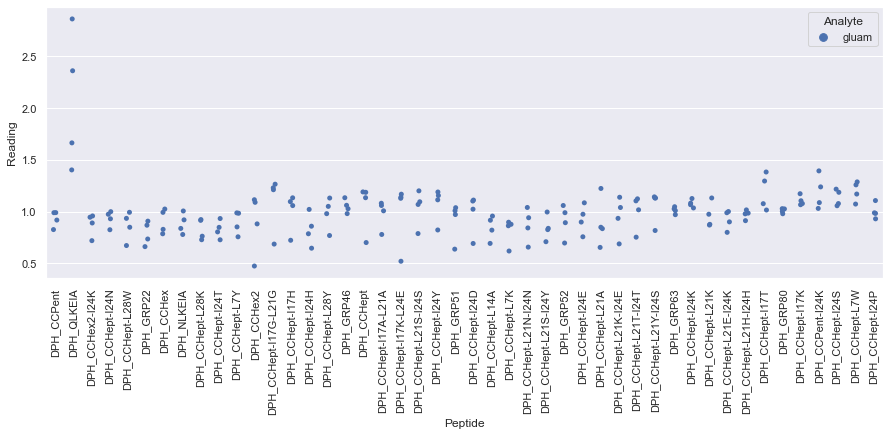

 WARNING - median fluorescence of (mal + DPH_QLKEIA + fluorophore) is less than fluorescence of (mal + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for mal_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

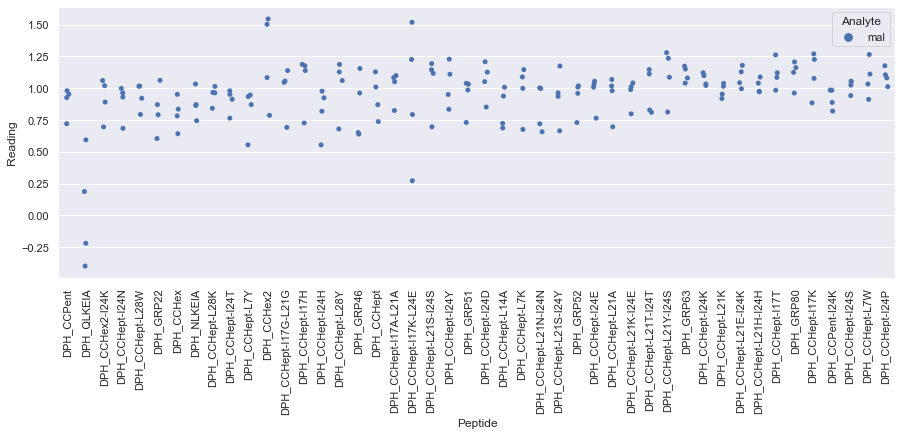

Drawing scatter plot of data spread for man_repeat_7 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

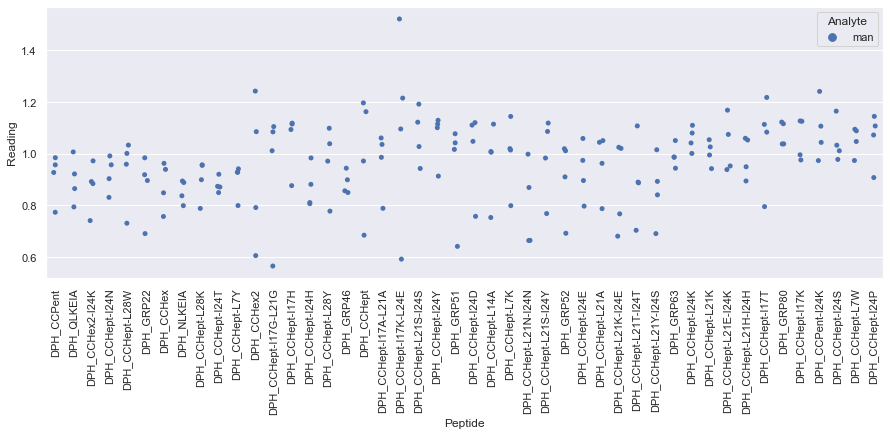

Drawing scatter plot of data spread for fru_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

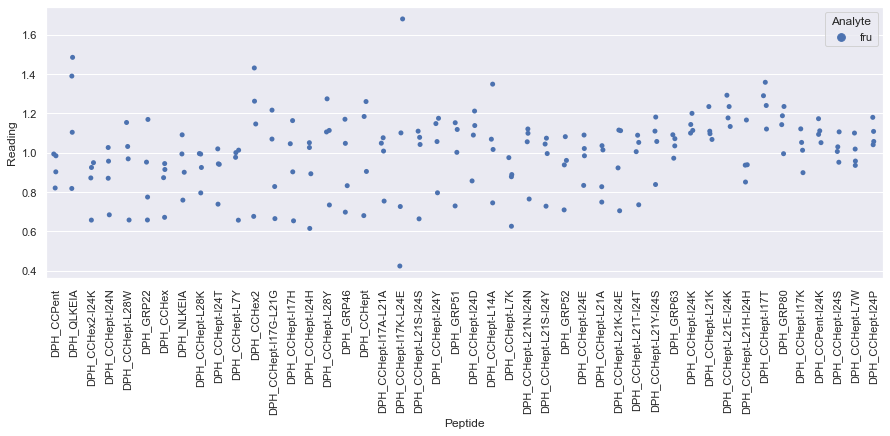

Drawing scatter plot of data spread for glu_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

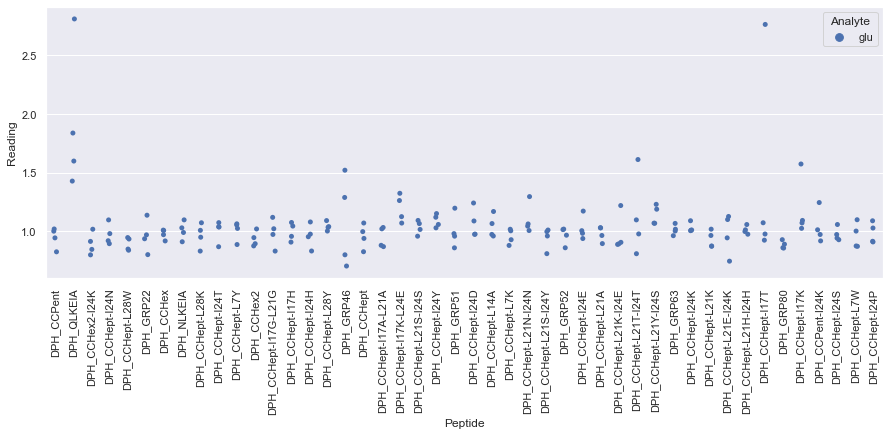

Drawing scatter plot of data spread for gluam_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

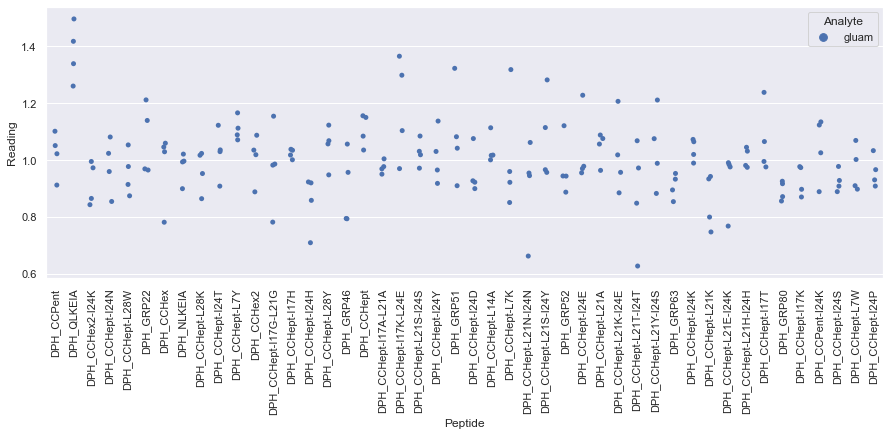

 WARNING - median fluorescence of (mal + DPH_QLKEIA + fluorophore) is less than fluorescence of (mal + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/mal_repeat_8.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for mal_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

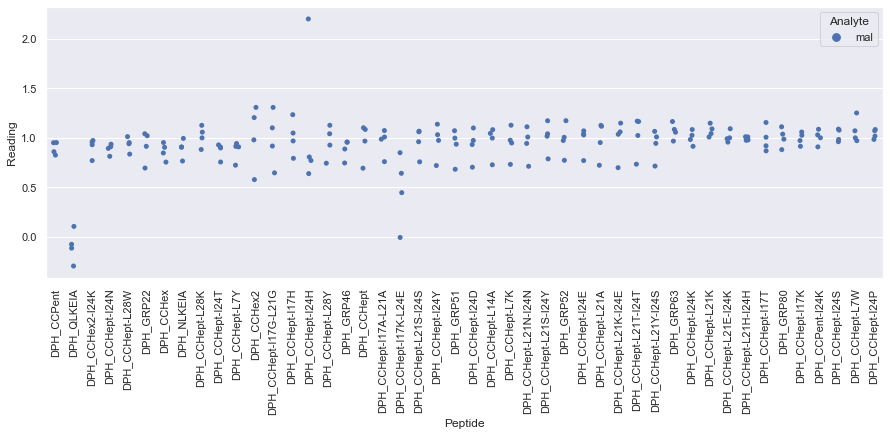

Drawing scatter plot of data spread for man_repeat_8 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

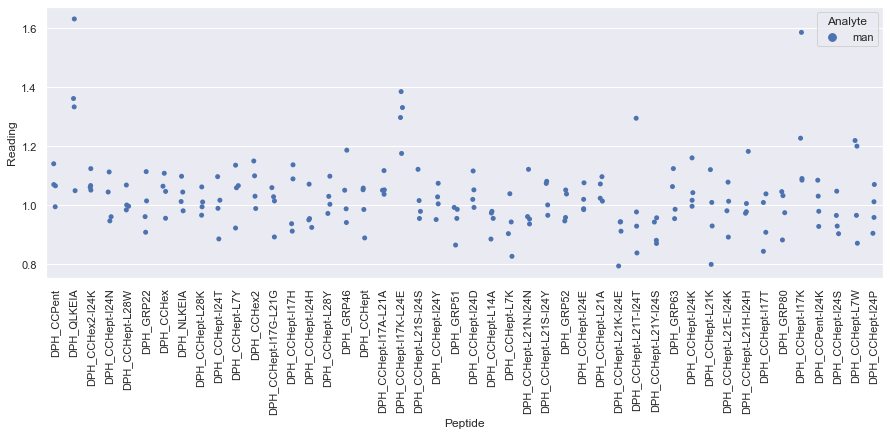

Drawing scatter plot of data spread for fru_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

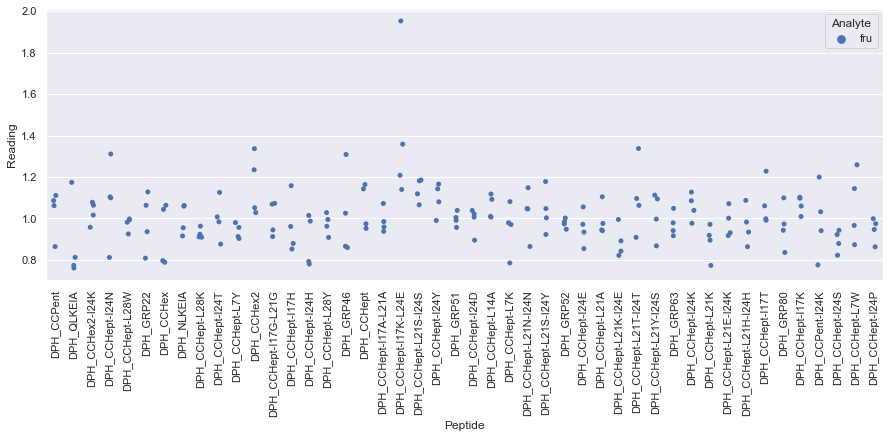

Drawing scatter plot of data spread for glu_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

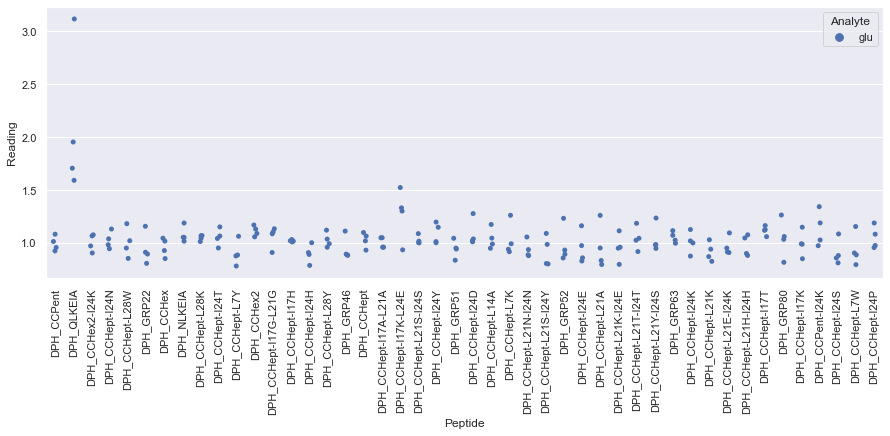

Drawing scatter plot of data spread for gluam_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

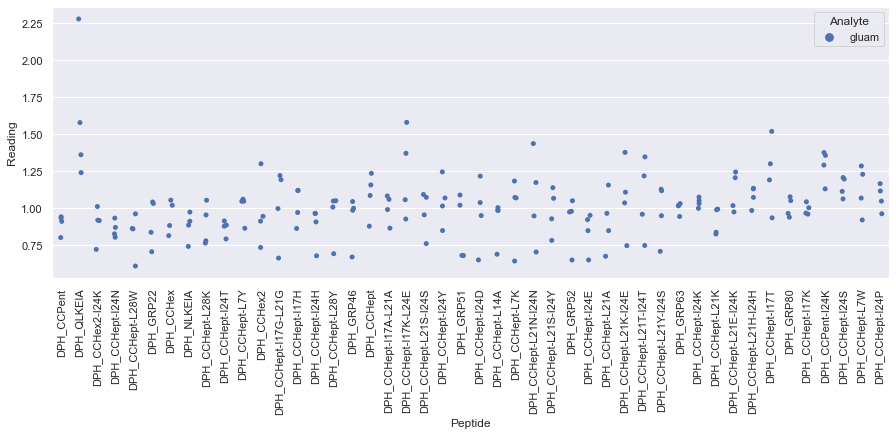

Drawing scatter plot of data spread for mal_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

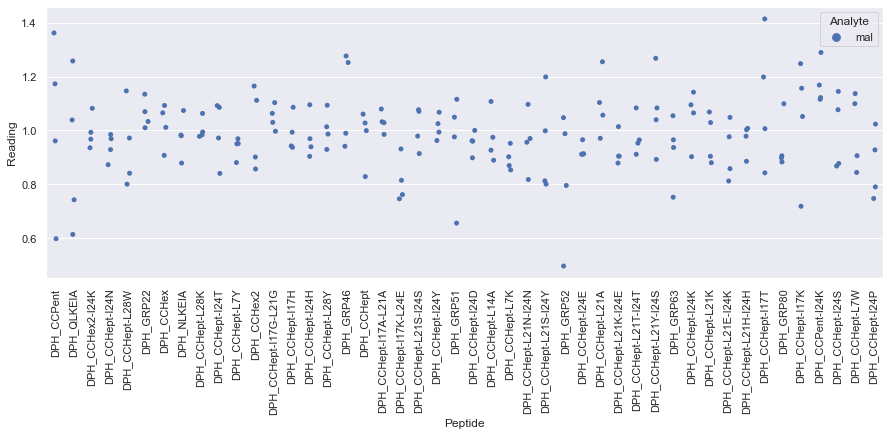

Drawing scatter plot of data spread for man_repeat_9 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

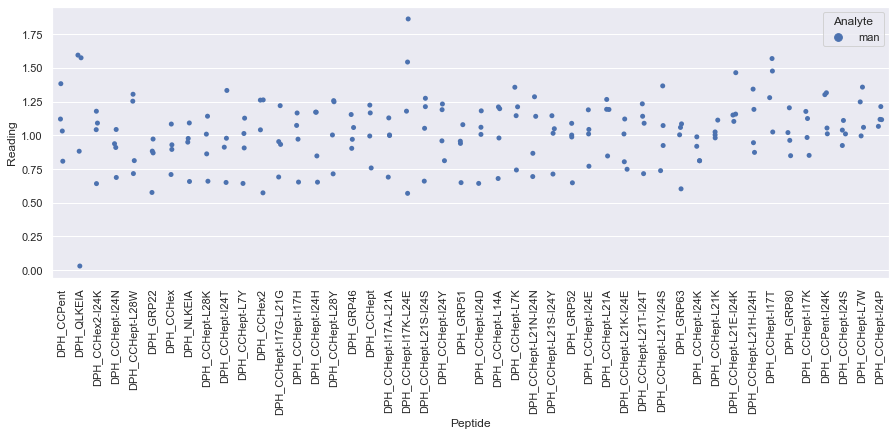

Drawing scatter plot of data spread for fru_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

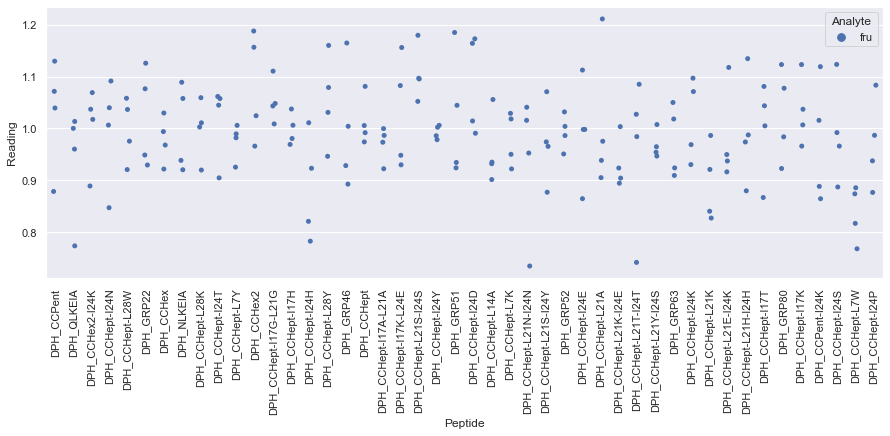

Drawing scatter plot of data spread for glu_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

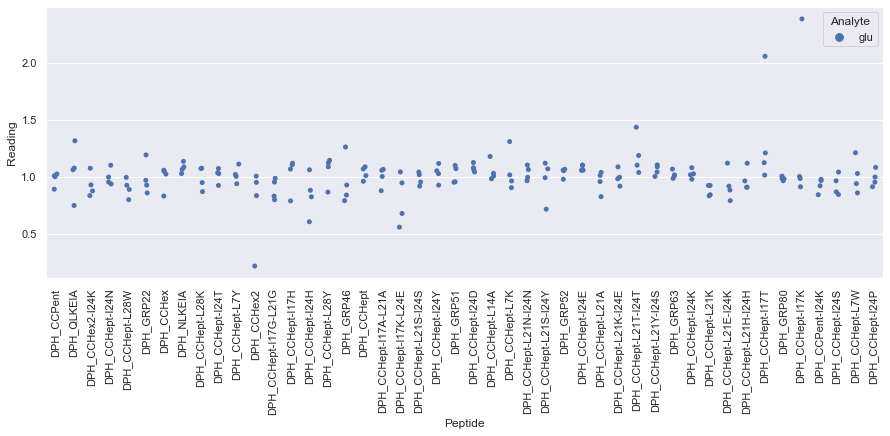

Drawing scatter plot of data spread for gluam_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

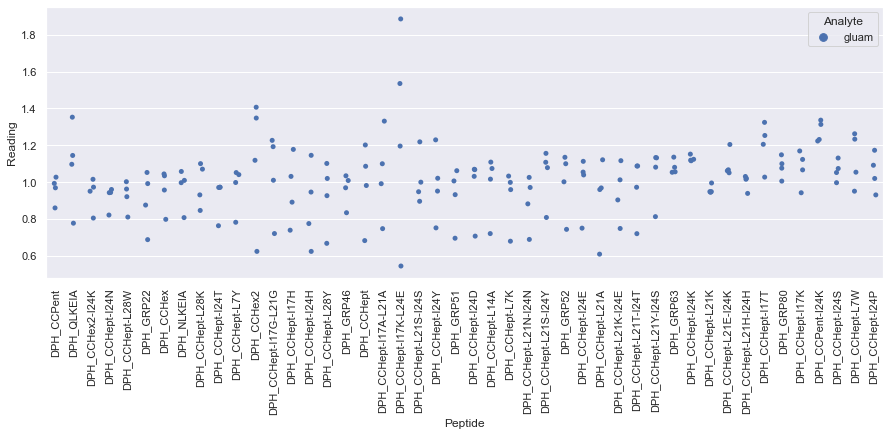

Drawing scatter plot of data spread for mal_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

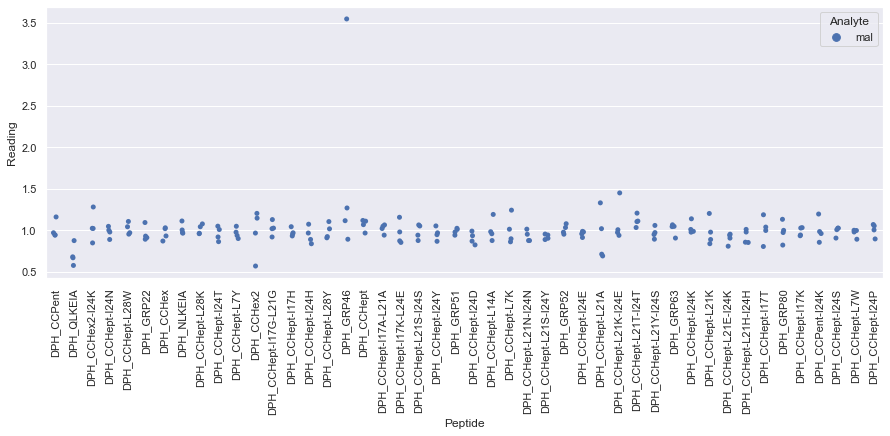

Drawing scatter plot of data spread for man_repeat_10 in Sugar_scaled_data


<Figure size 720x720 with 0 Axes>

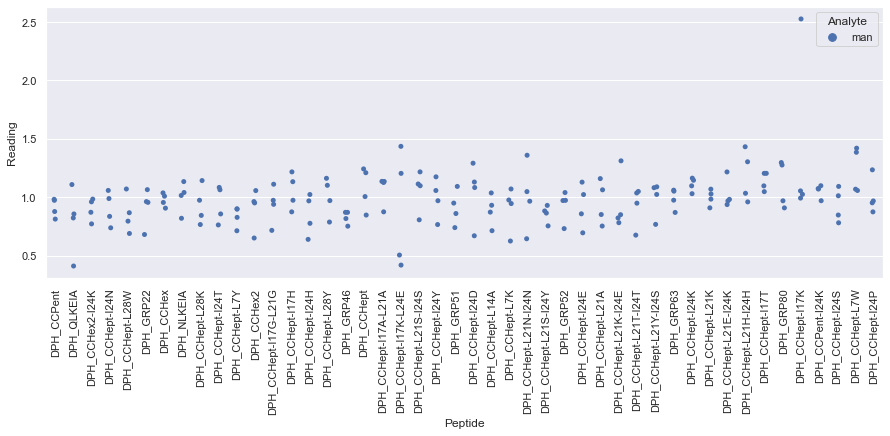



Outliers on the same plate:

/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-I24N, 5154.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-L28K, 24009.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-L21K, 5090.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-L21E-I24K, 6301.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-I17K, 1343.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/Sugars/Reformatted_sugar_csvs/fru_repeat_1.xlsx: blank, DPH_CCHept-I24S, 13076.0
/Users/ks17361/Lab_work_De

In [6]:
sugar_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='Sugar'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous
- The fluorescence of peptides GRP35, QLKEIA and CCHept-I17K-L24E in the presence of DPH is very similar to that of DPH on its own.
- In all cases, addition of analyte causes little/no (by eye) noticeable change in fluorescence signal. Hence training a model to distinguish the unique fingerprints of the different sugar classes that performs well may be difficult.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
sugar_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_fru: fru, DPH_CCHept-L7K, 0.7478243927782829
repeat_1_fru: fru, DPH_CCHept-L21A, 0.6936249622657044
repeat_1_fru: fru, DPH_CCHept-I24P, 0.9025750430421439
repeat_1_glu: glu, DPH_QLKEIA, 1.4666666666666666
repeat_1_glu: glu, DPH_CCHept-L21A, 1.2876719439397872
repeat_1_glu: glu, DPH_CCHept-L21Y-I24S, 0.8038316746803832
repeat_1_glu: glu, DPH_GRP63, 1.0634136382196815
repeat_1_gluam: gluam, DPH_CCHex2-I24K, 0.6733983074149889
repeat_1_gluam: gluam, DPH_GRP22, -0.003287954131681204
repeat_1_gluam: gluam, DPH_CCHept-L7Y, 0.8293958293958293
repeat_1_gluam: gluam, DPH_CCHept-I17G-L21G, 0.5530310401868249
repeat_1_gluam: gluam, DPH_CCHept, 0.7321971683272155
repeat_1_gluam: gluam, DPH_CCHept-I17A-L21A, 0.7923772425696325
repeat_1_gluam: gluam, DPH_CCPent-I24K, 16.41392543859649
repeat_1_mal: mal, DPH_GRP51, 0.17836010143702452
repeat_1_mal: mal, DPH_CCHept-I24E, 0.8462747916713461
repeat_1_mal: mal, DPH_CCHept-L21T-I24T, 0.2268723970778999
repeat_1_mal: mal

 Outlier excluded from final output dataset: 0, mal
DPH_CCPent                                 1.012229
DPH_QLKEIA                                  1.34507
DPH_CCHex2-I24K                            1.031678
DPH_CCHept-I24N                            1.034306
DPH_CCHept-L28W                            0.976176
DPH_GRP22                                  0.991588
DPH_CCHex                                  1.067952
DPH_NLKEIA                                 1.031925
DPH_CCHept-L28K                            1.099965
DPH_CCHept-I24T         Outlier: 1.7524456972309734
DPH_CCHept-L7Y                             1.003918
DPH_CCHex2                                 0.883505
DPH_CCHept-I17G-L21G                        0.99009
DPH_CCHept-I17H                            0.942586
DPH_CCHept-I24H                            0.912088
DPH_CCHept-L28Y                             0.99094
DPH_GRP46                                  1.003961
DPH_CCHept                                 1.092876
DPH_CCHept-I

Display range of data points across repeats for the different analytes




Original_data:


fru


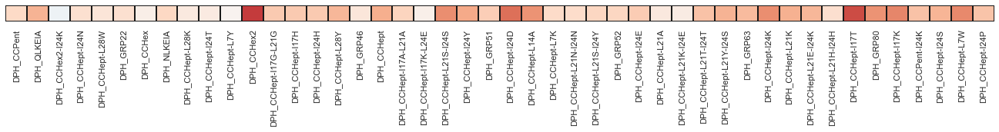


glu


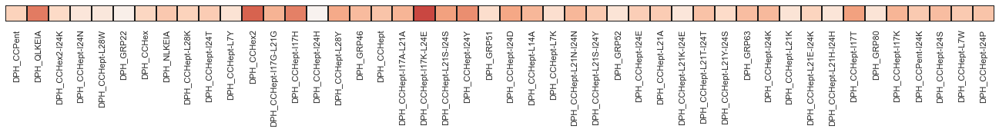


gluam


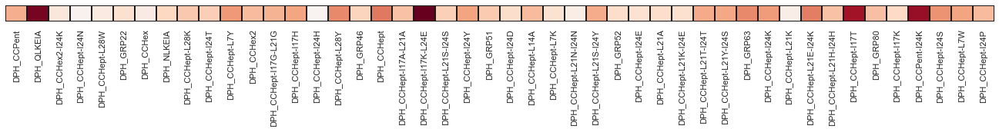


mal


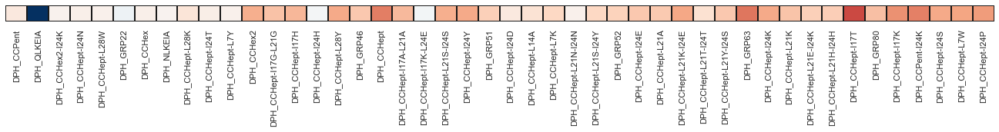


man


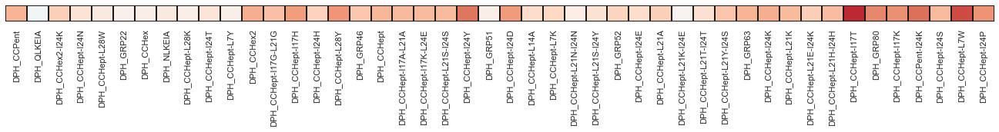




Scaled_data:


fru


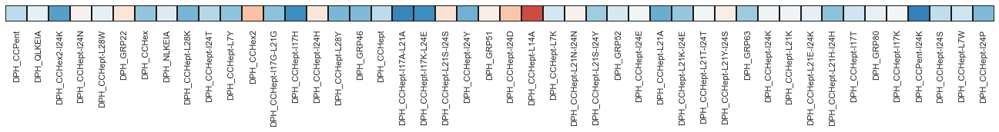


glu


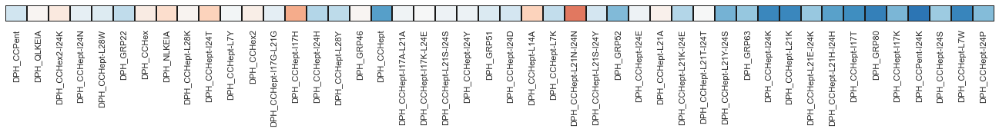


gluam


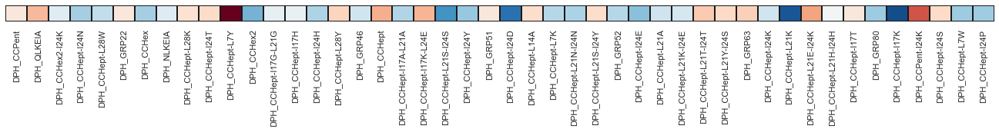


mal


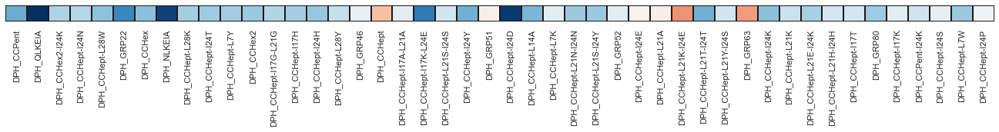


man


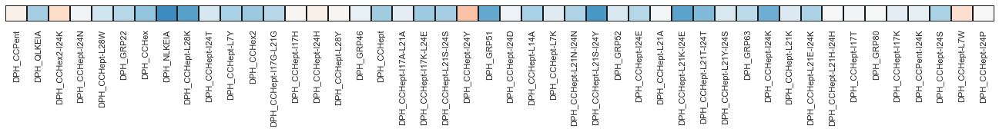




Original_data:



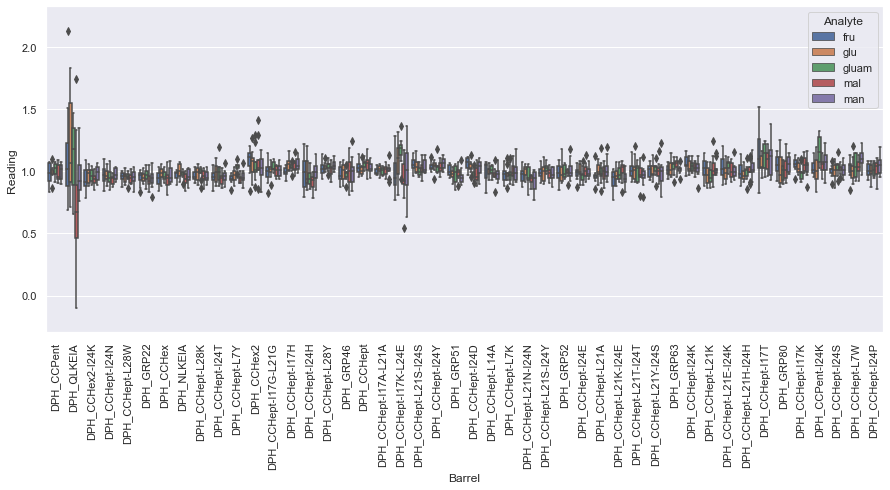

fru


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


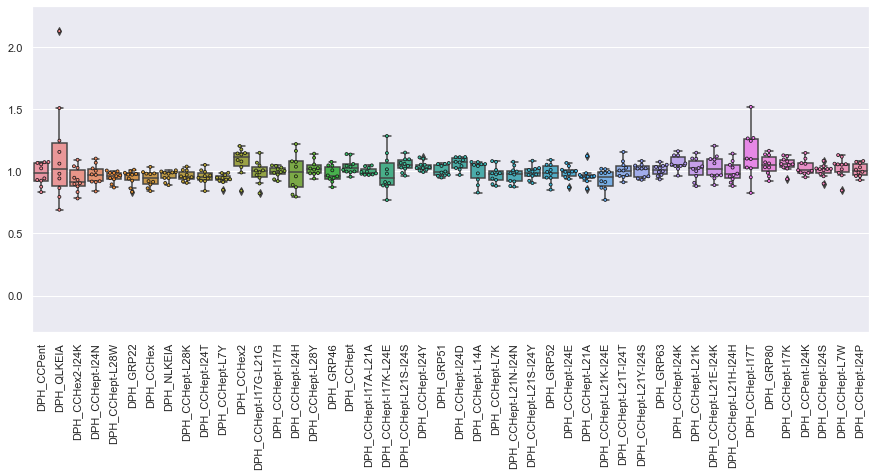

glu


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


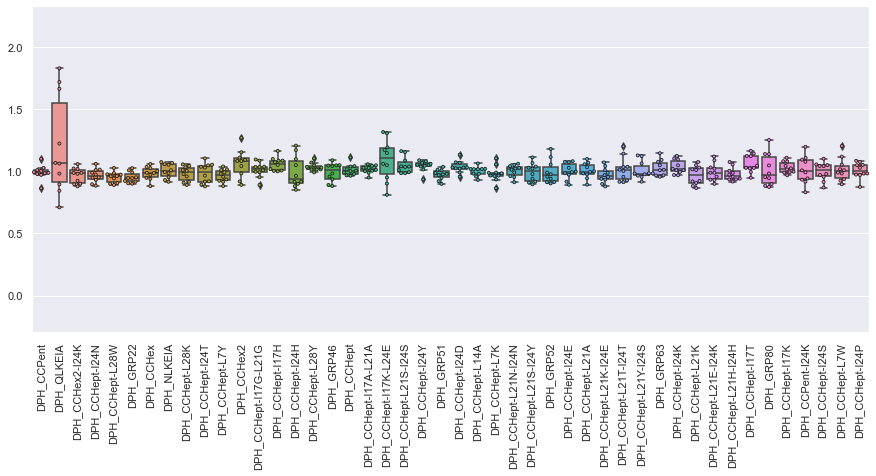

gluam


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


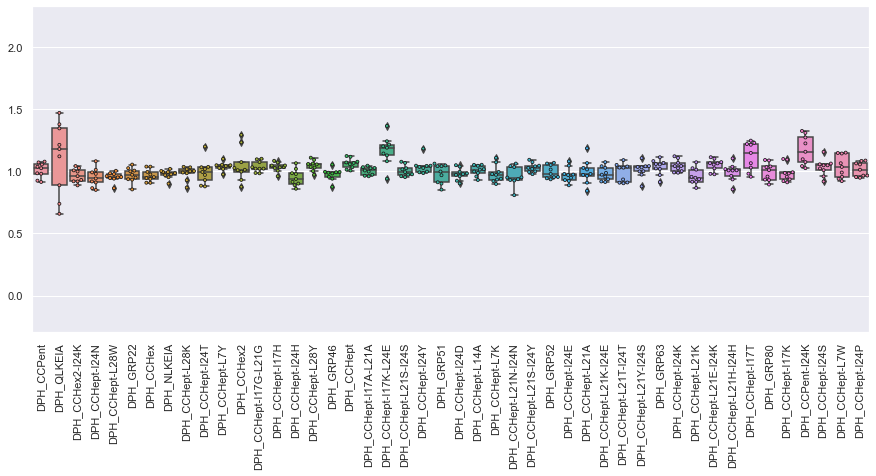

mal


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


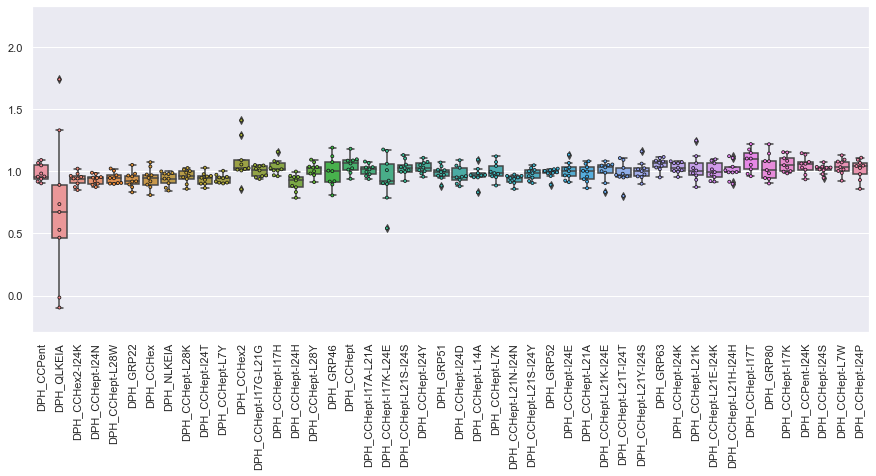

man


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


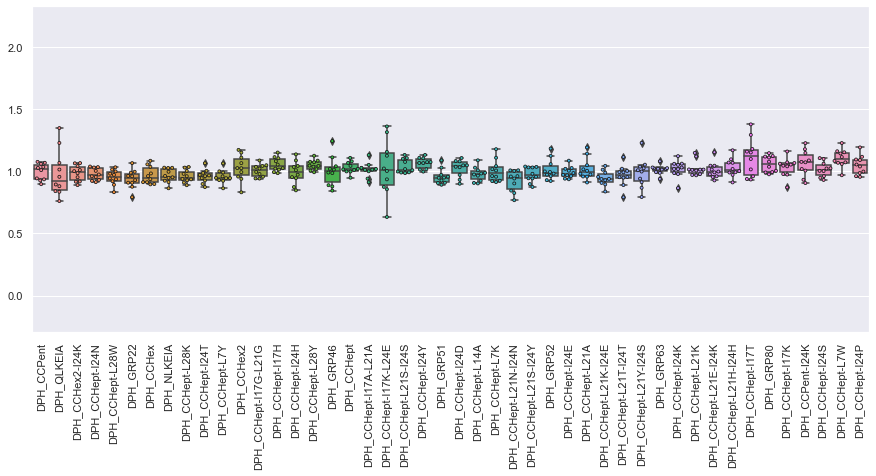




Scaled_data:



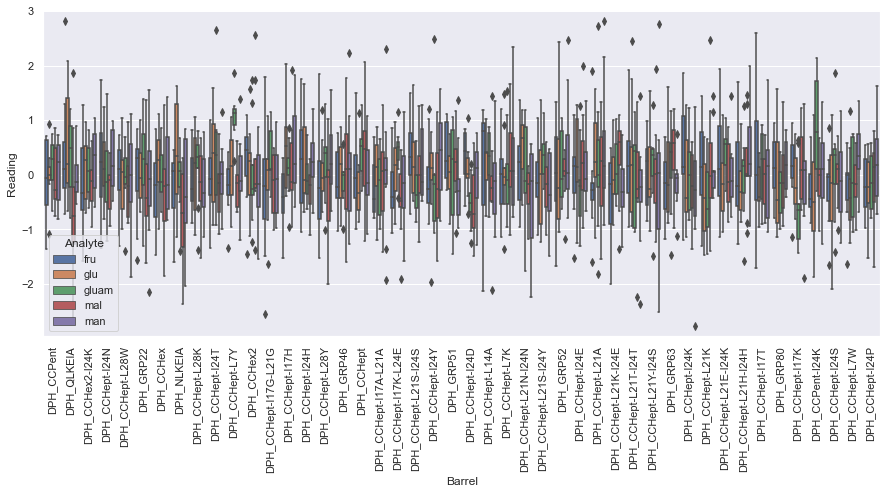

fru


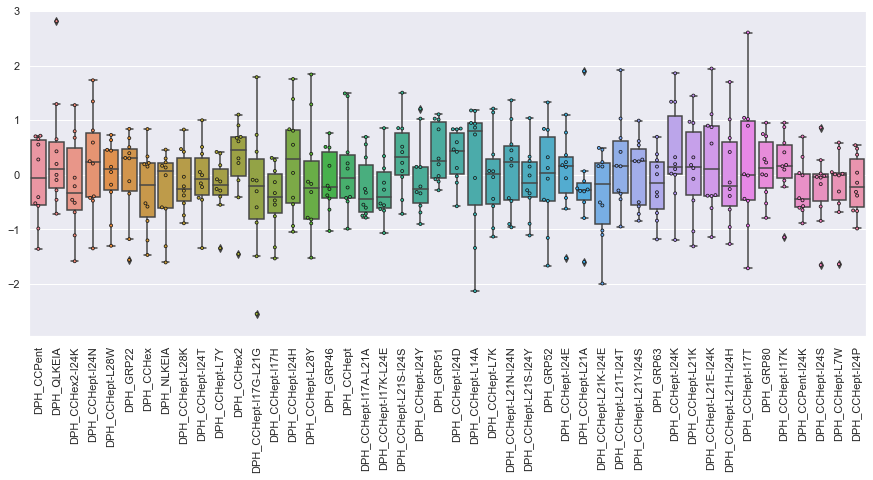

glu


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


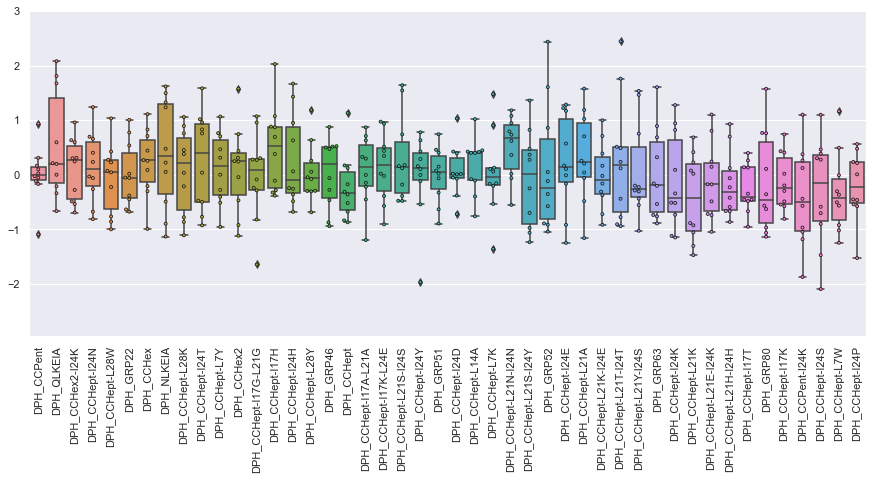

gluam


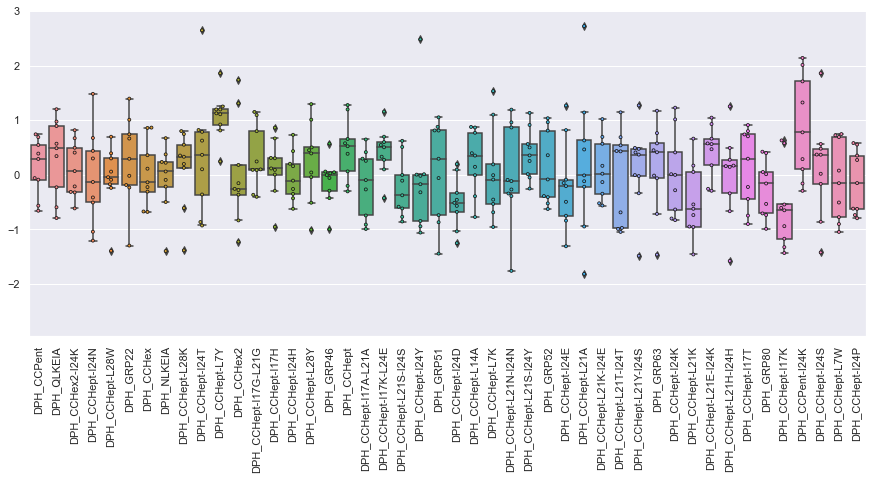

mal


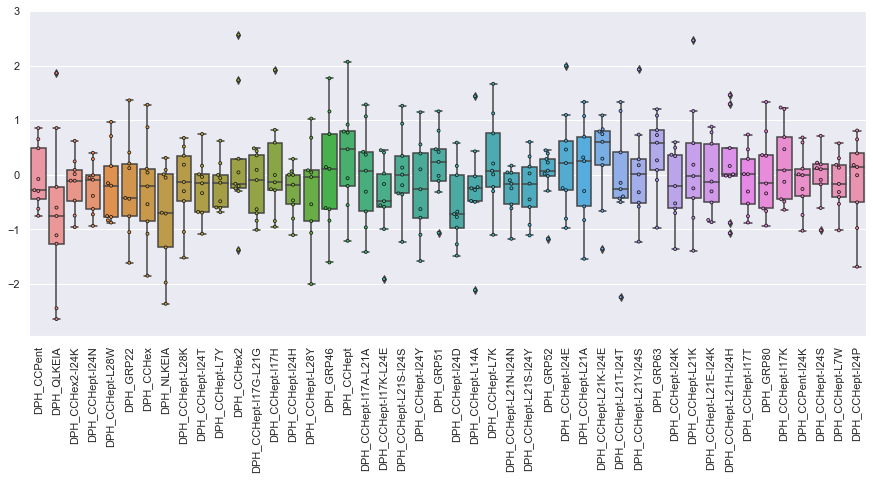

man


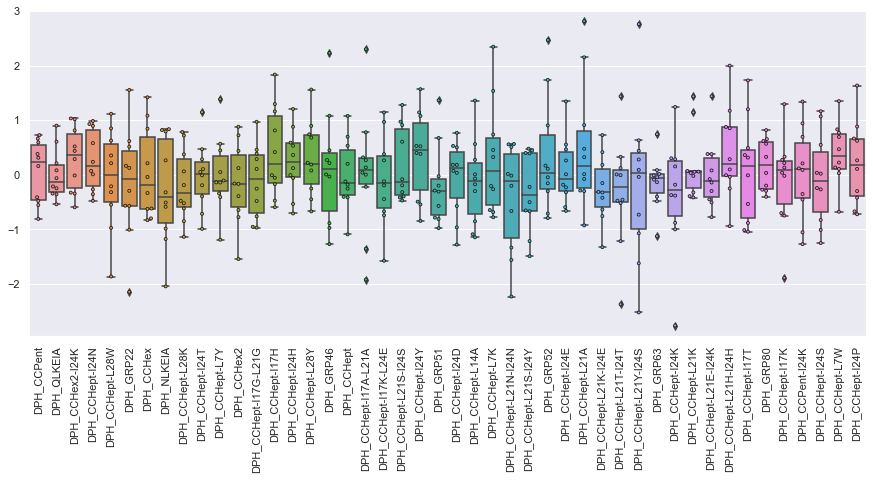

In [8]:
sugar_fluor_data.display_data_distribution()

- There is very little difference between the fingerprints of the different analytes. Peptide QLKEIA in particular has an especially large range for the unscaled data. However, the degree of overlap between the readings for the different classes is not noticeably poorer for OLKEIA as as compared to the other peptides when looking at the scaled data, hence I will not exclude any of the features from the initial ML dataset.

In [9]:
sugar_fluor_data.ml_fluor_data

,DPH_CCPent,DPH_QLKEIA,DPH_CCHex2-I24K,DPH_CCHept-I24N,DPH_CCHept-L28W,DPH_GRP22,DPH_CCHex,DPH_NLKEIA,DPH_CCHept-L28K,DPH_CCHept-I24T,...,DPH_CCHept-L21E-I24K,DPH_CCHept-L21H-I24H,DPH_CCHept-I17T,DPH_GRP80,DPH_CCHept-I17K,DPH_CCPent-I24K,DPH_CCHept-I24S,DPH_CCHept-L7W,DPH_CCHept-I24P,Analyte
0,1.067249,1.061404,0.930518,0.974706,0.986582,0.941292,0.982774,0.945126,1.010415,0.920501,...,1.095147,1.029638,1.244386,1.135611,1.057832,1.147379,1.083942,1.056854,0.996107,fru
1,1.023382,0.690217,1.092062,0.971062,0.966632,0.834383,0.977192,0.988439,0.952275,1.007237,...,0.888868,0.908712,0.825995,1.062858,1.049984,1.008481,0.959748,1.053025,0.928841,fru
2,0.929441,0.865031,0.903539,1.068681,0.935655,0.987581,0.915296,0.980295,0.971700,0.966054,...,1.119402,1.142357,0.951529,1.129966,1.120896,1.059988,1.018290,1.060613,1.031531,fru
3,0.875429,1.508475,0.832761,0.917173,0.869452,0.972457,0.840453,0.905449,0.906673,0.947368,...,0.965952,1.052145,1.267616,1.032518,0.937197,0.990571,1.022743,1.129959,1.013060,fru
4,1.072976,1.155779,0.781212,1.004087,0.960213,0.979373,1.035184,0.990321,1.037728,0.960859,...,0.967611,0.969925,1.102072,0.921684,1.055556,0.981503,1.019704,0.967253,0.989376,fru
5,0.831905,2.127451,0.878794,0.919547,0.894355,0.972952,0.992821,0.993940,0.934672,0.923737,...,1.064398,1.082189,1.518006,1.071640,1.128230,1.065174,1.040557,1.015320,1.064631,fru
6,0.924035,0.941748,0.947549,0.837797,0.944620,0.924430,0.862978,0.888350,0.945624,0.841140,...,1.097872,0.881572,1.098394,0.987486,1.094323,1.003704,1.008683,1.117092,1.075748,fru
7,0.942728,1.246032,0.897593,0.912835,0.999524,0.862581,0.893130,0.946443,0.958286,0.941402,...,1.205056,0.937015,1.264180,1.164580,1.031708,1.101504,1.017302,0.987347,1.082026,fru
8,1.074247,0.793548,1.040113,1.101920,0.987546,0.999889,0.920378,1.007278,0.917730,0.995928,...,0.966478,0.958800,1.029903,0.958367,1.078798,0.986959,0.900943,1.055456,0.960998,fru
9,1.055340,0.980000,1.027093,1.023074,1.005902,1.012482,0.980785,0.997954,1.006680,1.051143,...,0.943299,0.980566,1.024188,1.030550,1.021768,0.951786,0.978841,0.845216,0.961973,fru


#### ML analysis

In [10]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/'
                'Sugars/Sugar_ML_plots',
    fluor_data=sugar_fluor_data.ml_fluor_data,
    classes=sugar_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=None, shuffle=False
)

- Calculate feature correlations

In [11]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size

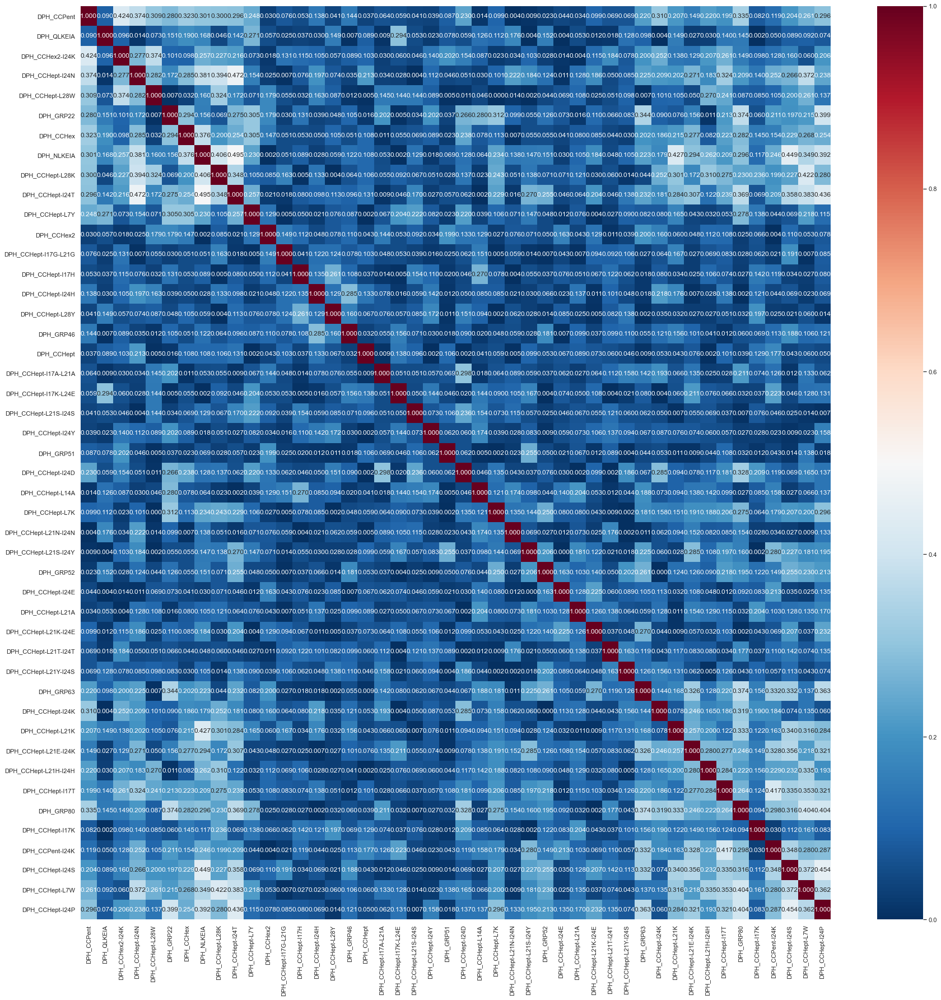

In [12]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

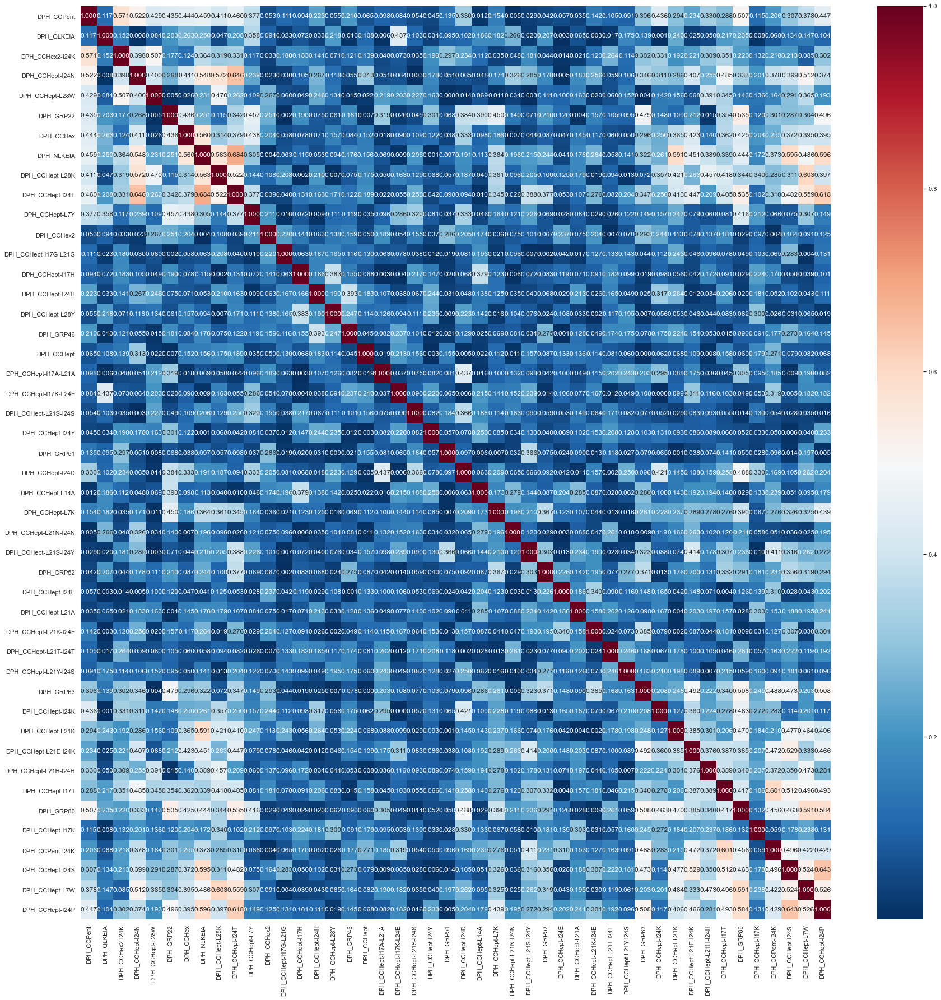

In [13]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

In [14]:
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

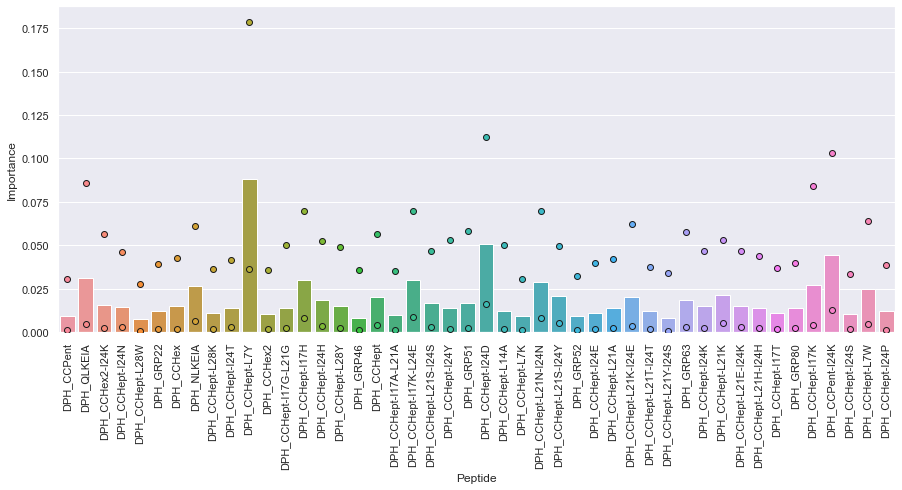

<Figure size 720x720 with 0 Axes>

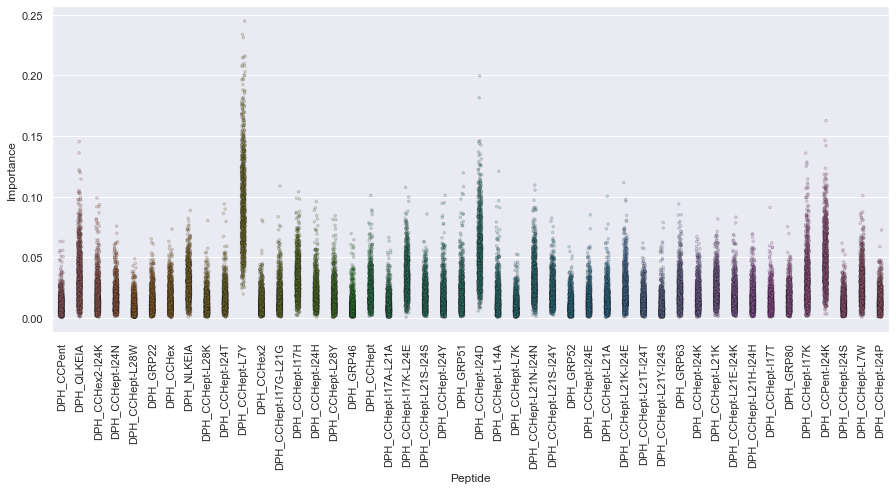

In [15]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [16]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score
0,DPH_CCHept-L7Y,0.088225
1,DPH_CCHept-I24D,0.050800
2,DPH_CCPent-I24K,0.044708
3,DPH_QLKEIA,0.031165
4,DPH_CCHept-I17H,0.030123
5,DPH_CCHept-I17K-L24E,0.030022
6,DPH_CCHept-L21N-I24N,0.028924
7,DPH_CCHept-I17K,0.027297
8,DPH_NLKEIA,0.026694
9,DPH_CCHept-L7W,0.025157


KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another.

CCHept-L7Y, CCHept-I24D and CCPent-I24K have the highest importance scores with this method.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

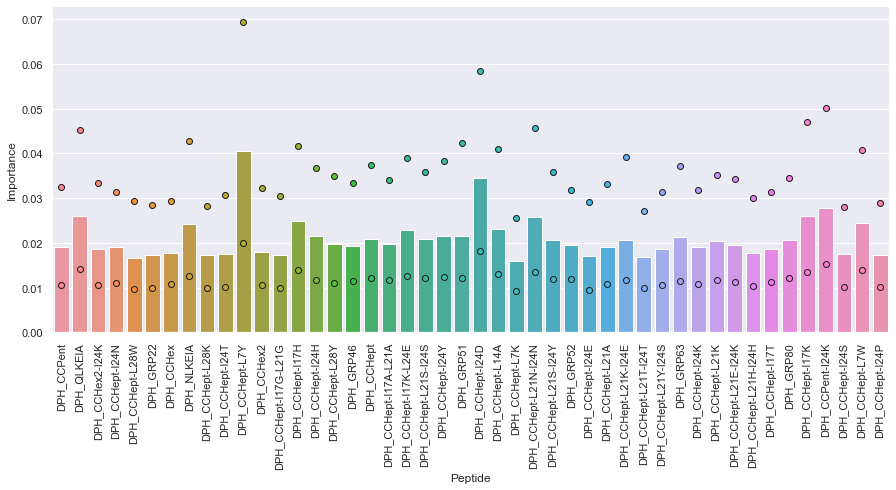

<Figure size 720x720 with 0 Axes>

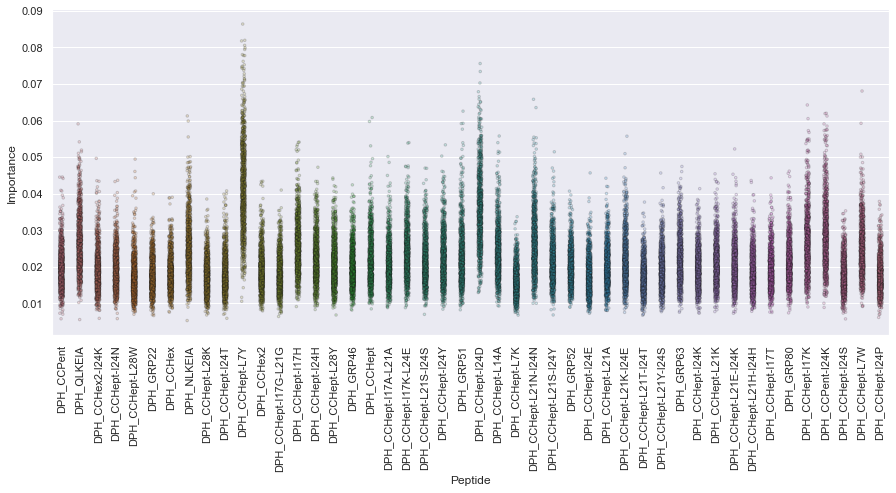

In [17]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [18]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score
0,DPH_CCHept-L7Y,0.040594
1,DPH_CCHept-I24D,0.034582
2,DPH_CCPent-I24K,0.027767
3,DPH_QLKEIA,0.026048
4,DPH_CCHept-I17K,0.025974
5,DPH_CCHept-L21N-I24N,0.025729
6,DPH_CCHept-I17H,0.024910
7,DPH_CCHept-L7W,0.024408
8,DPH_NLKEIA,0.024229
9,DPH_CCHept-L14A,0.023114


In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

The same three peptides (CCHept-L7Y, CCHept-I24D and CCPent-I24K) as identified in KBest analysis are again found to have the highest importance scores with this method.

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

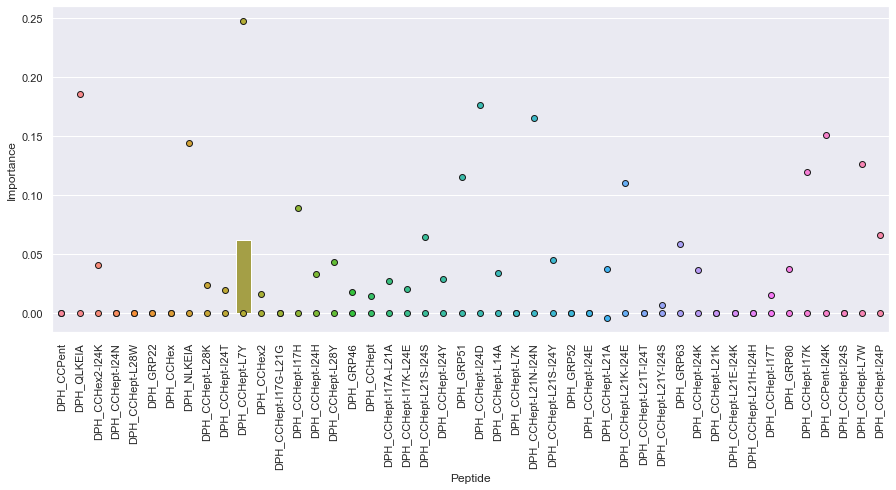

<Figure size 720x720 with 0 Axes>

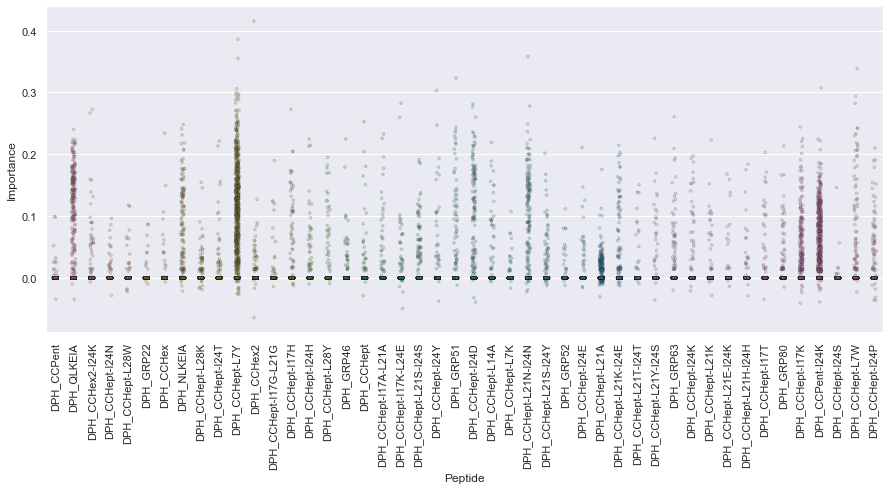

In [19]:
f1 = make_scorer(f1_score, average='weighted')
permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1, num_repeats=1000,
    scale=True, plt_name=''
)

In [20]:
print('Peptides ordered by median importance:')
permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score
0,DPH_CCHept-L7Y,0.062077
1,DPH_CCPent,0.000000
2,DPH_CCHept-I24K,0.000000
3,DPH_CCHept-L21N-I24N,0.000000
4,DPH_CCHept-L21S-I24Y,0.000000
5,DPH_GRP52,0.000000
6,DPH_CCHept-I24E,0.000000
7,DPH_CCHept-L21A,0.000000
8,DPH_CCHept-L21K-I24E,0.000000
9,DPH_CCHept-L21T-I24T,0.000000


In [21]:
mean_permut_feat_importances_df = OrderedDict({})
for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
mean_permut_feat_importances_df = pd.DataFrame({'Feature': list(mean_permut_feat_importances_df.keys()),
                                                'Score': list(mean_permut_feat_importances_df.values())})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [22]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score
0,DPH_CCHept-L7Y,0.077957
1,DPH_CCPent-I24K,0.030682
2,DPH_QLKEIA,0.026754
3,DPH_CCHept-L21N-I24N,0.015545
4,DPH_CCHept-I24D,0.013840
5,DPH_CCHept-I17K,0.011504
6,DPH_NLKEIA,0.011246
7,DPH_CCHept-L7W,0.007738
8,DPH_GRP51,0.006507
9,DPH_CCHept-L21K-I24E,0.005772


In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

As can be seen from the plots, most of the features provide little unique information about the output class. CCHept-L7Y, CCPent-I24K and CCHept-I24D are again found to be three of the most important peptides. Interestingly, QLKEIA, which as described above has little effect upon the fluorescence of DPH, is found to be an important peptide - this could be because the "unique information" it is providing is mostly noise, combined with the fact that none of the peptides provide much information about the output analyte class since the analytes have minimal effect upon the interaction of DPH with the peptides.

So, whilst there is variation in the relative order of the less important peptides, all three methods agree that CCHept-L7Y, CCPent-I24K and CC-Hept-I24D are three of the most informative peptides, with respect to both their independent relationship with the output class label plus the unique information they provide.

- What percentage of the signal in the data can be measured by N principal components?

/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


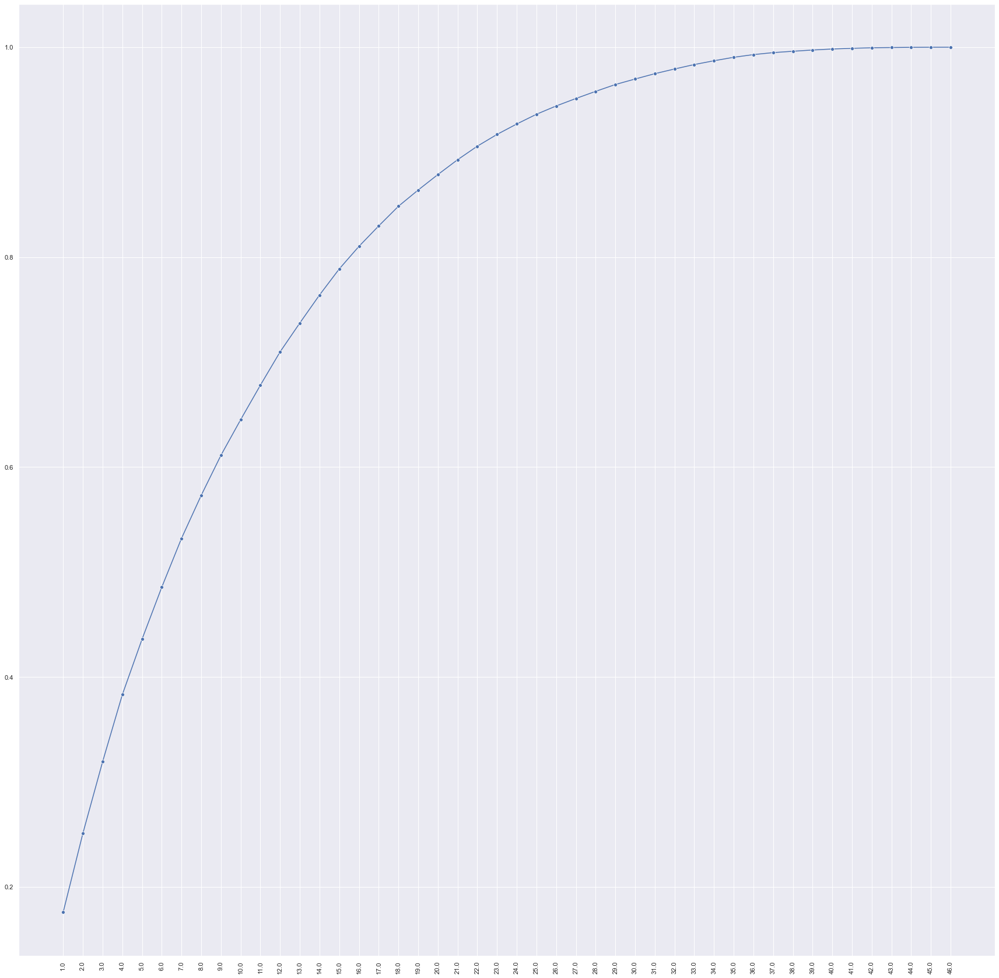

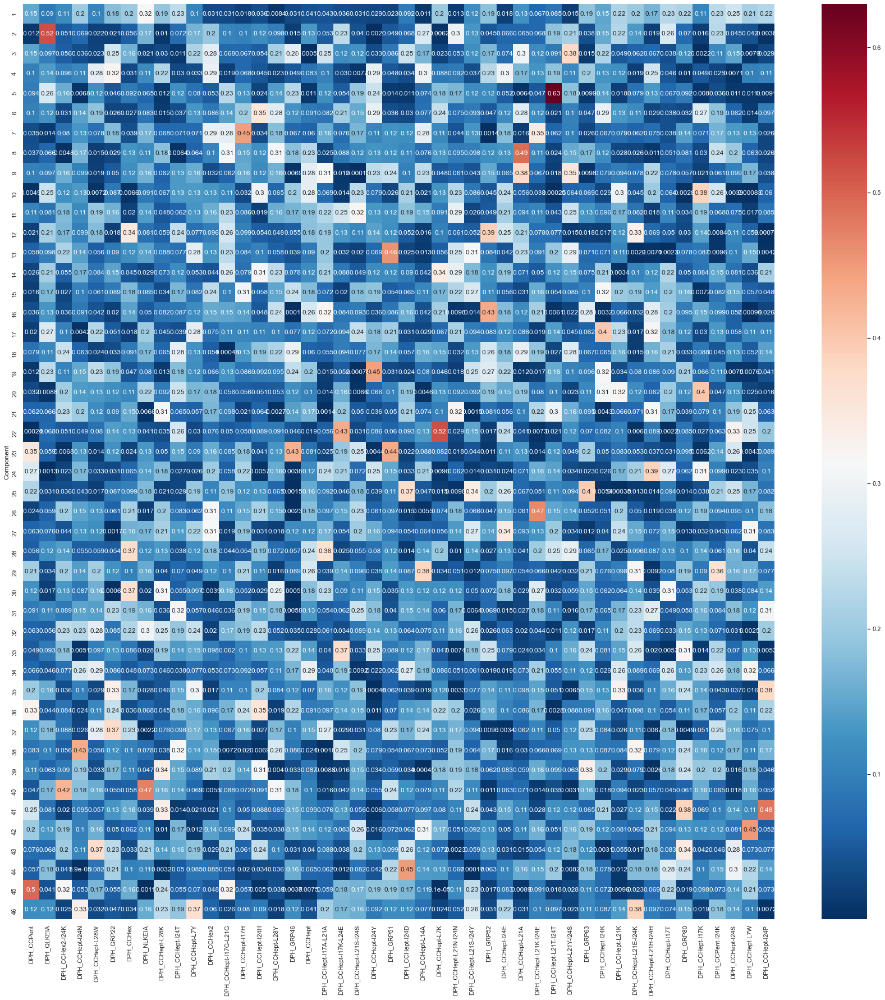

In [23]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(fluor_data=ml.fluor_data, scale=True, plt_name='')
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

~25 components are required to explain >90% of the variance in the data. Lots of different peptides make a contribution to the first principal component. The feature that makes by far the largest contribution to the second principal component is QLKEIA, which is not overly surprising given that as described above permutation analysis identifies it as one of the peptides that provides the most unique information about the output class.

Scatter plots of data transformed to PCA dimensions

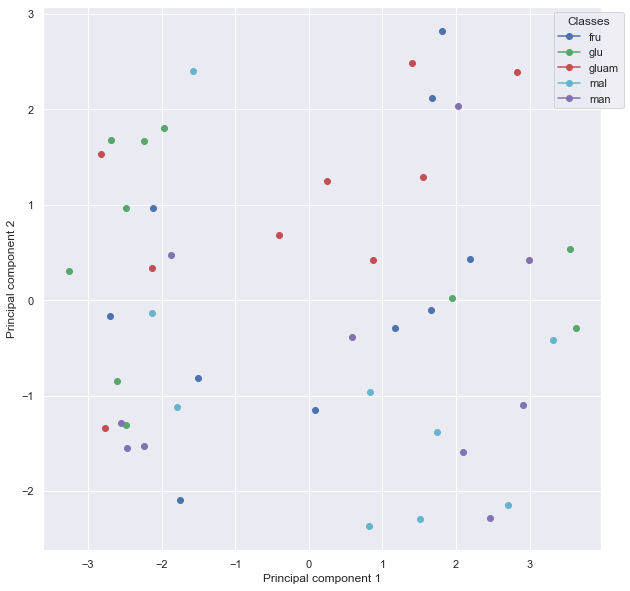

In [24]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=None, num_dimensions=2, scale=True, plt_name=''
)

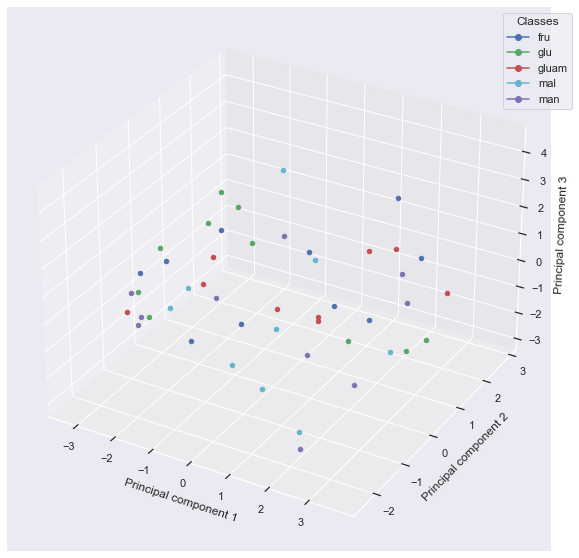

In [25]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=None, num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter and box plots of fluorescence readings, the sugar classes aren't distinguishable from one another by eye when plotted on PCA axes.

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 5 different ML algorithms. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [26]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': [],})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        fixed_params = ml.define_fixed_model_params(classifier=algorithm())
        if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
            fixed_params['random_state'] = 1
        tuned_params = ml.define_tuned_model_params(
            classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
            n_folds=cv_folds_inner_loop
        )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=list(ml.features),
            inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )

        all_feat_searches[
            '{}__{}'.format(algorithm.__name__, resampling_method)
        ] = copy.deepcopy(nested_cv_search)

        all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        for index, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))





KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 9), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.2
F1: 0.21333333333333332




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5
F1: 0.4666666666666666




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'distance')])
Accuracy: 0.4
F1: 0.42666666666666664




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.0
F1: 0.0




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.1111111111111111
F1: 0.07407407407407407




Gaussia

/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)






LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.3
F1: 0.26666666666666666




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 32.0)])
Accuracy: 0.2
F1: 0.18




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.5)])
Accuracy: 0.2
F1: 0.16666666666666666




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.1111111111111111
F1: 0.07407407407407407




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.1111111111111111
F1: 0.08888888888888889
Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






SVC: no_balancing
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), 

In [27]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [28]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,0.242222,0.183841,0.242222,0.183841,0.284444,0.234610,0.236148,0.185467
1,GaussianNB,no_balancing,0.146667,0.104089,0.146667,0.104089,0.122222,0.132777,0.122402,0.111121
2,LinearSVC,no_balancing,0.184444,0.070132,0.184444,0.070132,0.139259,0.069836,0.155259,0.069498
3,SVC,no_balancing,0.184444,0.099281,0.184444,0.099281,0.129270,0.084217,0.139280,0.078949
4,AdaBoostClassifier,no_balancing,0.313333,0.095942,0.313333,0.095942,0.177683,0.086050,0.201848,0.081836


In [29]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

Many of the algorithms do not perform much better than random guessing (which would have an expected accuracy of ~0.2). However, AdaBoost classifier does slightly better than random guessing => will take this algorithm forwards.

In [30]:
all_feat_searches['AdaBoostClassifier__no_balancing']['outer_loop_params']

[OrderedDict([('random_state', 1), ('n_estimators', 31)]),
 OrderedDict([('random_state', 1), ('n_estimators', 10)]),
 OrderedDict([('random_state', 1), ('n_estimators', 10)]),
 OrderedDict([('random_state', 1), ('n_estimators', 31)]),
 OrderedDict([('random_state', 1), ('n_estimators', 10)])]

In [31]:
all_feat_searches['AdaBoostClassifier__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('random_state', 1), ('n_estimators', 31)])),
             ('recall',
              OrderedDict([('random_state', 1), ('n_estimators', 31)])),
             ('precision',
              OrderedDict([('random_state', 1), ('n_estimators', 31)])),
             ('f1', OrderedDict([('random_state', 1), ('n_estimators', 31)]))])

In [32]:
all_feat_searches['AdaBoostClassifier__no_balancing']['test_scores']['accuracy']

[0.4, 0.3, 0.2, 0.4444444444444444, 0.2222222222222222]

In [33]:
all_feat_nested_pred = all_feat_searches['AdaBoostClassifier__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['AdaBoostClassifier__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['AdaBoostClassifier__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

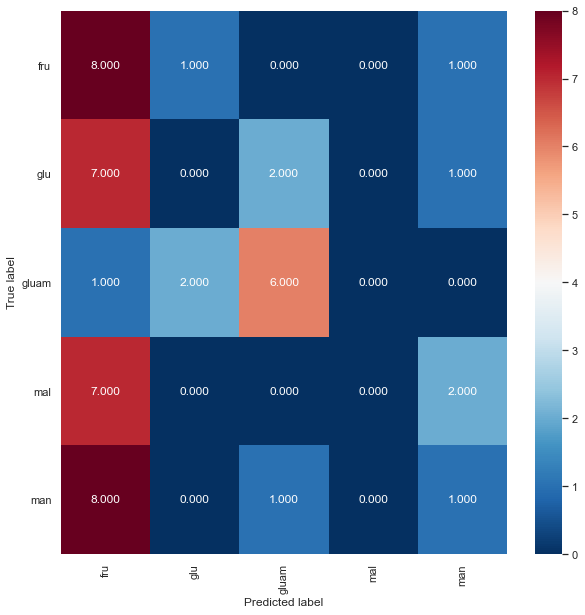

Normalised over true label (rows)


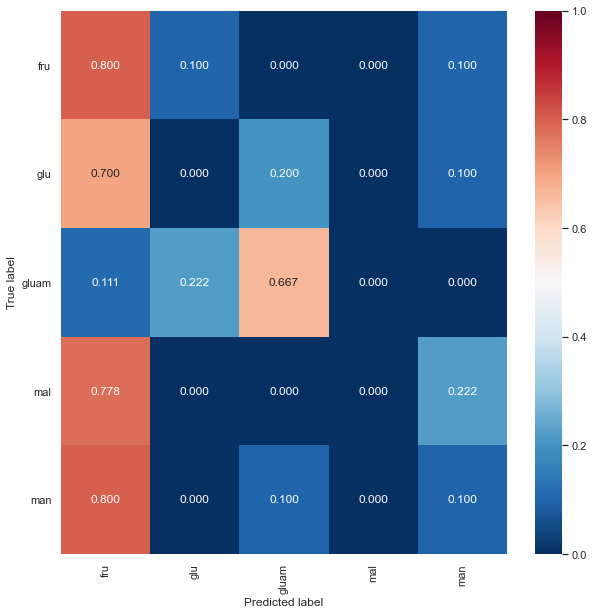

Normalised over pred label (columns)


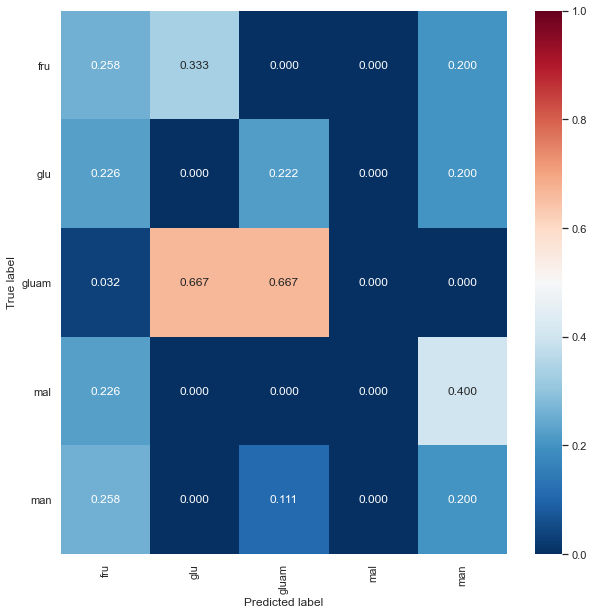

In [34]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [35]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

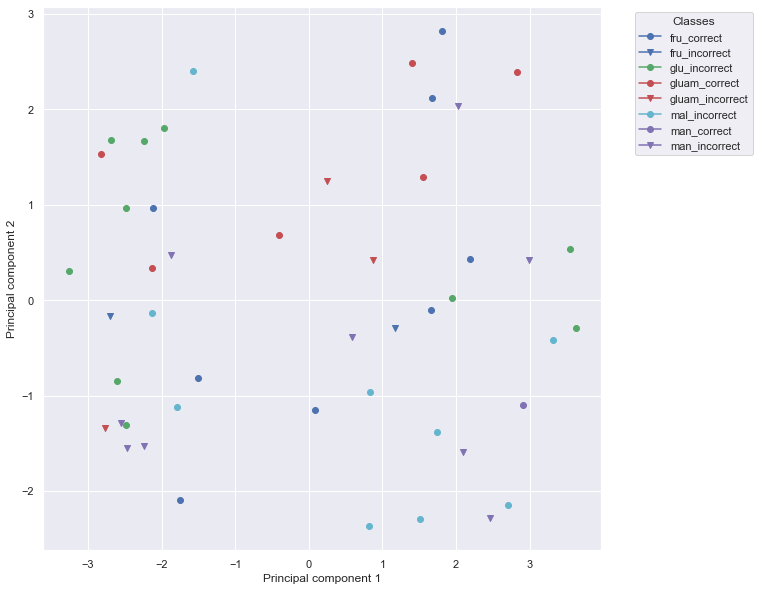

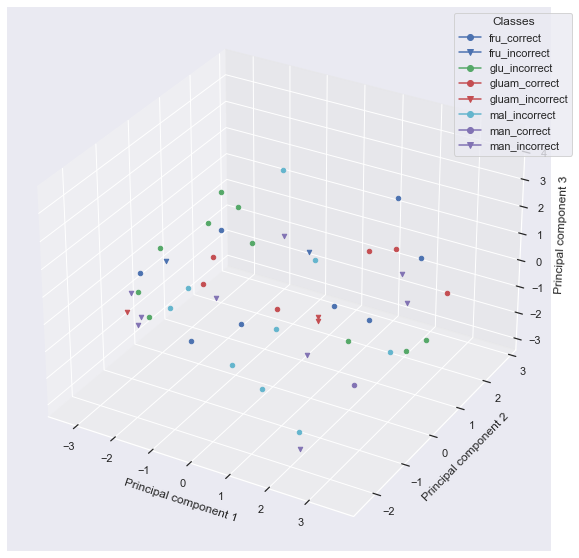

In [36]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# fru_incorrect = Value that is actually fructose is predicted to be something else

So, the trained AdaBoost classifier performs slightly better than random guessing. In particular, it is somewhat able to distinguish gluam, whereas it struggles to distinguish between the other four analytes (predicting most analytes to be fructose).

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [37]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': [],})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
                    n_folds=cv_folds_inner_loop
                )
                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=selected_features,
                    inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                red_feat_searches[
                    '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

                red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

                for index, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))






KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3
F1: 0.24000000000000005




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.2
F1: 0.19047619047619047




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.1
F1: 0.08




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 12), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.39682539682539686




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_nei





KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'distance')])
Accuracy: 0.1
F1: 0.05714285714285715




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 14), ('p', 2), ('weights', 'distance')])
Accuracy: 0.4
F1: 0.38




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'distance')])
Accuracy: 0.4
F1: 0.4133333333333333




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.20105820105820107




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), 





KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3
F1: 0.3238095238095238




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.6
F1: 0.5533333333333333




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.2
F1: 0.2333333333333333




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 2), ('weights', 'distance')])
Accuracy: 0.3333333333333333
F1: 0.23809523809523814




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('met





GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.36666666666666664




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.21333333333333332




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.36




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5555555555555555




GaussianNB: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict()
Accuracy: 0.2222222222222222
F1: 0.2




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.15714285714285717




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.2
F1: 0.18




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.4
F1: 0.31428571428571433




GaussianNB: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.423

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.2
F1: 0.1142857142857143




LinearSVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.3
F1: 0.21000000000000002




LinearSVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 256.0)])
Accuracy: 0.3
F1: 0.22666666666666666




LinearSVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.3333333333333333
F1: 0.21164021164021163




LinearSVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.33333333

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.2
F1: 0.21333333333333332




LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.5
F1: 0.44666666666666666




LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.2
F1: 0.13333333333333333




LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.125)])
Accuracy: 0

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.2
F1: 0.13333333333333333




LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.5
F1: 0.44000000000000006




LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('random





SVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.6
F1: 0.5599999999999999




SVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1), ('C', 512.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.3
F1: 0.26




SVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1), ('C', 2048.0), ('gamma', 0.00048828125), ('kernel', 'rbf')])
Accuracy: 0.6
F1: 0.6066666666666667




SVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1), ('C', 256.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6444444444444444




SVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.3777777777777778
Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0





SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.3
F1: 0.29333333333333333




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 4096.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.3
F1: 0.27999999999999997




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 4096.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.4
F1: 0.36




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 128.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.4021164021164021




SVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('C', 512.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.2222222222222222
F1: 0.25925925925925924
Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.





AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.1
F1: 0.08




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.2
F1: 0.1




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.2
F1: 0.12444444444444444




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.2222222222222222
F1: 0.13756613756613756




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.2222222222222222
F1: 0.09876543209876544




AdaBoostClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.26




AdaBoostClassifier: no_balancin





AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.1
F1: 0.08




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.2
F1: 0.1




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.2
F1: 0.12444444444444444




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.2222222222222222
F1: 0.13756613756613756




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.2222222222222222
F1: 0.09876543209876544




AdaBoostClassifier: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4
F1: 0.24888888

In [38]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [39]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,1,0.231111,0.128697,0.231111,0.128697,0.199111,0.108517,0.203683,0.111950
1,KNeighborsClassifier,no_balancing,KBest_Fscore,2,0.313333,0.095942,0.313333,0.095942,0.251481,0.097713,0.265249,0.080360
2,KNeighborsClassifier,no_balancing,KBest_Fscore,3,0.506667,0.145144,0.506667,0.145144,0.550000,0.190451,0.494582,0.149572
3,KNeighborsClassifier,no_balancing,KBest_Fscore,4,0.437778,0.119588,0.437778,0.119588,0.455926,0.105685,0.419513,0.103572
4,KNeighborsClassifier,no_balancing,KBest_Fscore,5,0.464444,0.181407,0.464444,0.181407,0.461111,0.171981,0.435704,0.159926
...,...,...,...,...,...,...,...,...,...,...,...,...
95,AdaBoostClassifier,no_balancing,Permutation_score,10,0.313333,0.095942,0.313333,0.095942,0.177683,0.086050,0.201848,0.081836
96,AdaBoostClassifier,no_balancing,Permutation_score,15,0.248889,0.076206,0.248889,0.076206,0.092127,0.053507,0.129283,0.063449
97,AdaBoostClassifier,no_balancing,Permutation_score,20,0.228889,0.036918,0.228889,0.036918,0.105460,0.078720,0.123949,0.053514
98,AdaBoostClassifier,no_balancing,Permutation_score,30,0.293333,0.106481,0.293333,0.106481,0.136571,0.090658,0.173727,0.095992


In [40]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, red_feat_score_df), f)

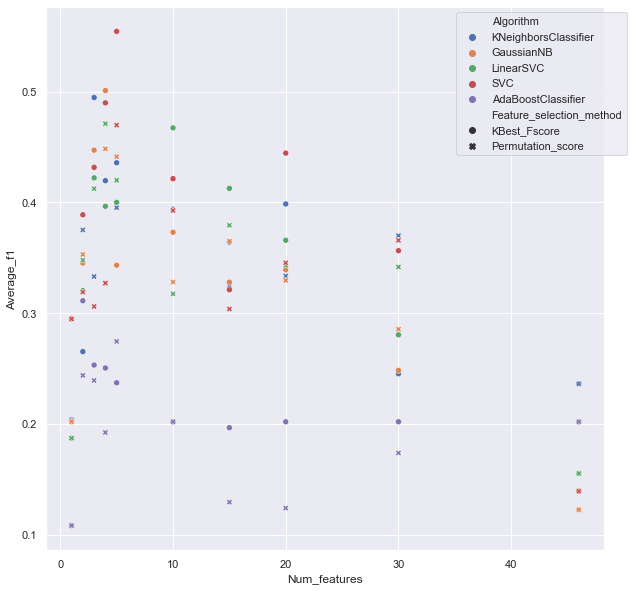

In [41]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

Model performance reaches a peak at ~3-5 features (for both feature selection methods), then declines when further features are included (which indicates that the additional features are just introducing noise that obscures the signal separating the five classes). The 3-5 features selected by KBest analysis tend to achieve a better performance than the 3-5 features selected by permutation analysis => the most important features selected by permutation analysis include more noise (which tallies with the fact that QLKEIA is selected as an important peptide with permutation analysis).

In [42]:
sub_red_feat_score_df = red_feat_score_df[
      (red_feat_score_df['Num_features'] == 5)
    & (red_feat_score_df['Feature_selection_method'] == 'KBest_Fscore')
].reset_index(drop=True)

In [43]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,5,0.464444,0.181407,0.464444,0.181407,0.461111,0.171981,0.435704,0.159926
1,GaussianNB,no_balancing,KBest_Fscore,5,0.373333,0.100025,0.373333,0.100025,0.351556,0.116054,0.343217,0.096570
2,LinearSVC,no_balancing,KBest_Fscore,5,0.460000,0.107864,0.460000,0.107864,0.404444,0.102571,0.400000,0.087866
3,SVC,no_balancing,KBest_Fscore,5,0.566667,0.186190,0.566667,0.186190,0.598519,0.209469,0.554286,0.186488
4,AdaBoostClassifier,no_balancing,KBest_Fscore,5,0.353333,0.080860,0.353333,0.080860,0.209683,0.083400,0.237086,0.084284


All of the algorithms now perform better than random guessing. SVC has the best performance scores across all four metrics => take forwards.

In [52]:
red_feat_searches['SVC__no_balancing__KBest_Fscore__5']['outer_loop_params']

[OrderedDict([('random_state', 1),
              ('C', 8.0),
              ('gamma', 0.125),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 8.0),
              ('gamma', 0.03125),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 8.0),
              ('gamma', 0.03125),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 32768.0),
              ('gamma', 0.00048828125),
              ('kernel', 'rbf')]),
 OrderedDict([('random_state', 1),
              ('C', 32768.0),
              ('gamma', 0.0001220703125),
              ('kernel', 'rbf')])]

In [53]:
red_feat_searches['SVC__no_balancing__KBest_Fscore__5']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('random_state', 1),
                           ('C', 8.0),
                           ('gamma', 0.03125),
                           ('kernel', 'rbf')])),
             ('recall',
              OrderedDict([('random_state', 1),
                           ('C', 8.0),
                           ('gamma', 0.03125),
                           ('kernel', 'rbf')])),
             ('precision',
              OrderedDict([('random_state', 1),
                           ('C', 8.0),
                           ('gamma', 0.03125),
                           ('kernel', 'rbf')])),
             ('f1',
              OrderedDict([('random_state', 1),
                           ('C', 8.0),
                           ('gamma', 0.03125),
                           ('kernel', 'rbf')]))])

In [54]:
red_feat_nested_pred = red_feat_searches['SVC__no_balancing__KBest_Fscore__5']['predictions']
red_feat_nested_y_true = red_feat_searches['SVC__no_balancing__KBest_Fscore__5']['y_true']
red_feat_nested_x_true = red_feat_searches['SVC__no_balancing__KBest_Fscore__5']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

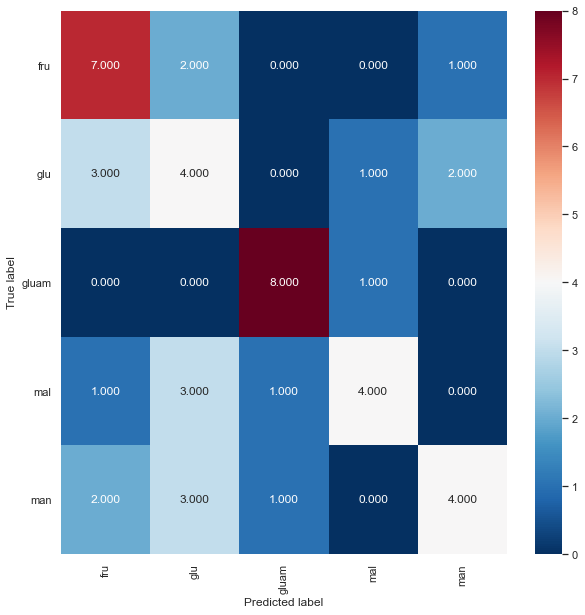

Normalised over true label (rows)


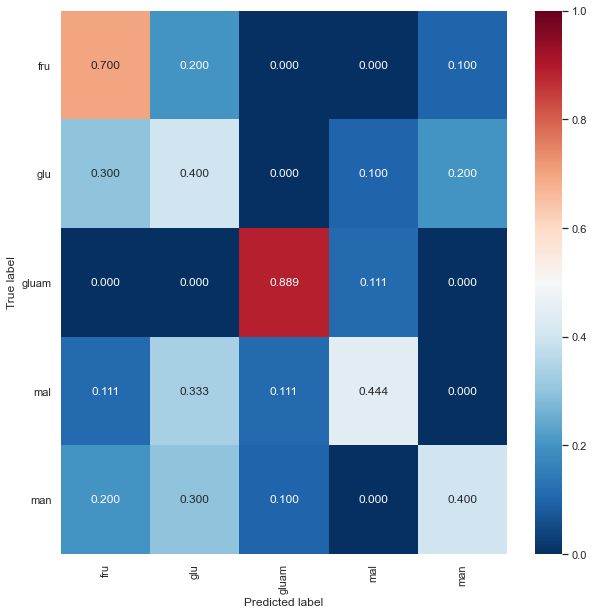

Normalised over pred label (columns)


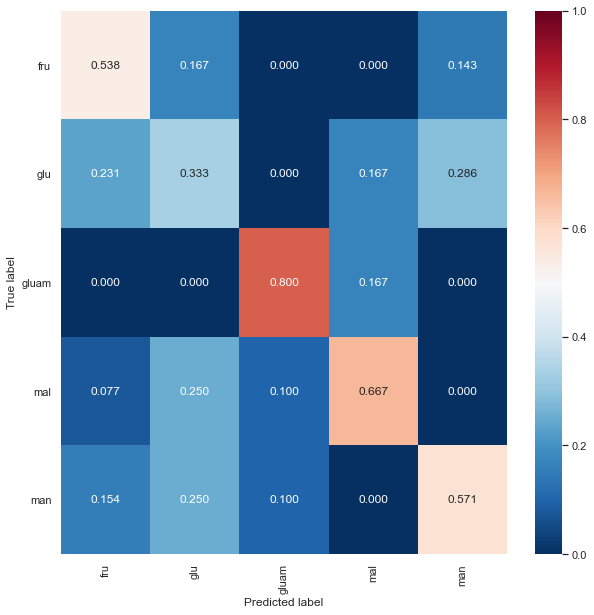

In [56]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [57]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

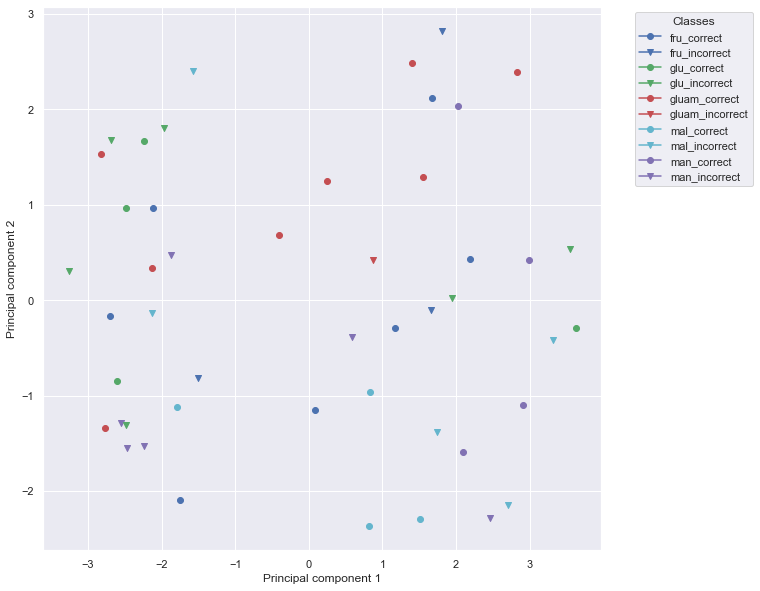

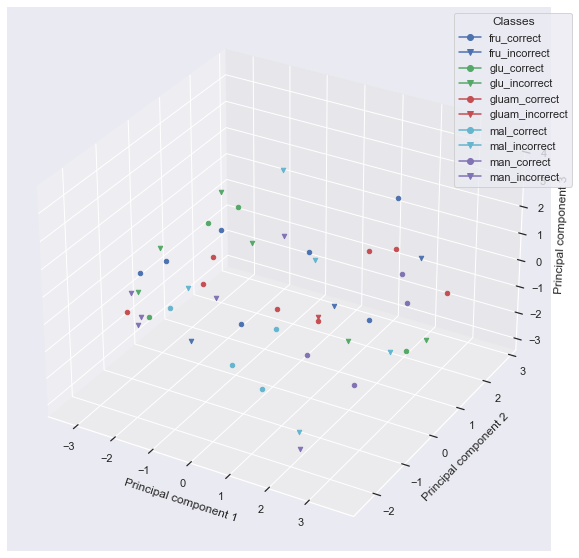

In [58]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# fru_incorrect = Value that is actually fructose is predicted to be something else

So, SVC model trained with just 5 peptides performs better than the AdaBoost model trained with all features.

Is there a significant difference between the two models?

In [61]:
params_1 = all_feat_searches['AdaBoostClassifier__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['SVC__no_balancing__KBest_Fscore__5']['best_outer_loop_params']['f1']
selected_features_2 = kbest_feat_importances_df['Feature'].tolist()[:5]

print('Model 1:')
print('Algorithm: AdaBoostClassifier')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: SVC')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=AdaBoostClassifier, classifier_2=SVC, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None,
)

Model 1:
Algorithm: AdaBoostClassifier
Parameters:
OrderedDict([('random_state', 1), ('n_estimators', 31)])
Features:
['DPH_CCPent', 'DPH_QLKEIA', 'DPH_CCHex2-I24K', 'DPH_CCHept-I24N', 'DPH_CCHept-L28W', 'DPH_GRP22', 'DPH_CCHex', 'DPH_NLKEIA', 'DPH_CCHept-L28K', 'DPH_CCHept-I24T', 'DPH_CCHept-L7Y', 'DPH_CCHex2', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I17H', 'DPH_CCHept-I24H', 'DPH_CCHept-L28Y', 'DPH_GRP46', 'DPH_CCHept', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17K-L24E', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-I24Y', 'DPH_GRP51', 'DPH_CCHept-I24D', 'DPH_CCHept-L14A', 'DPH_CCHept-L7K', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24Y', 'DPH_GRP52', 'DPH_CCHept-I24E', 'DPH_CCHept-L21A', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-L21Y-I24S', 'DPH_GRP63', 'DPH_CCHept-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-I17T', 'DPH_GRP80', 'DPH_CCHept-I17K', 'DPH_CCPent-I24K', 'DPH_CCHept-I24S', 'DPH_CCHept-L7W', 'DPH_CCHept-I24P']




Model 2:
Algorithm

In [62]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 8.563636363636357
p value: 0.014291221154118412


So, there is a significant difference in performance when reduce the number of peptides from 46 to 5 (if consider p threshold of 0.05) - reducing the number of peptides => less noise, better performance.